# Введение в машинное обучение, АБД

## НИУ ВШЭ, 2025-26 учебный год

# Домашнее задание 1. Часть 2. Регрессия и инференс модели

Задание выполнил(а):

**Кулешова Анастасия**

**В работе использоволись нейронка для**
- образовательных целей (как работают методы, что значат параметры, трактовка резльтата в каких-то странных случаях и т.д. для личного понимая)
- написание регулярного выражения при парсинге колонки `torque`
- помощь в реализации сервиса на апи. Последняя версия была со стримлит, но у меня чет с впн прям какие-то траблы были. Взяла версию с апи. Это было разрешено
- при оформлениии: работа была проделана большая и важно все не забыть, поэтому через копи паст попросила нейронку написать комментарии к коду

**Используемые нейронки**:
- дипсик для личных вопросов, парсинга, комментариев к коду
- клауд для реализации сервиса апи

В этом домашнем задании вам будет необходимо:
*  обучить модель регрессии для предсказания стоимости автомобилей;
*  реализовать веб-сервис для применения построенной модели на новых данных

> Оценка за домашнее задание = $min(\text{ваш балл}, 33)$

## Общая информация

__Внимание!__  

* Домашнее задание выполняется самостоятельно
* Не допускается помощь в решении домашнего задания от однокурсников или третьих лиц. «Похожие» решения считаются плагиатом, и все задействованные студенты — в том числе и те, у кого списали, — не могут получить за него больше 0 баллов
* Использование в решении домашнего задания за рамками справочной и образовательной информации генеративных моделей (ChatGPT и так далее) для генерации кода задания считается плагиатом, и такое домашнее задание оценивается в 0 баллов

**Примечание**

В каждой части оцениваются как код, **так и ответы на вопросы.** Вопросы подсвечены синим цветом.

Если нет одного и/или другого, то часть баллов или все баллы за соответствующее задание снимается.

## Импорт библиотек, установка констант

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import random
import seaborn as sns
import re

In [2]:
CARS_TRAIN = 'https://github.com/evgpat/datasets/raw/refs/heads/main/cars_train.csv'
CARS_TEST = 'https://github.com/evgpat/datasets/raw/refs/heads/main/cars_test.csv'

In [3]:
RANDOM_STATE = 42

In [4]:
random.seed(RANDOM_STATE)
np.random.seed(RANDOM_STATE)

## Задание 0

Для чего фиксируем сиды в ноутбуке?

Для воспроизводимости результата при повторном запуске кода

## Часть 1 | EDA




Первая часть состоит из классических шагов EDA:

- Базовый EDA и обработка признаков
- Визуализации признаков и их анализ

В следующих частях вы увидите бонусные задания. Бонусные задания выделены как **Дополнительное задание/Бонус**. Вы можете выполнять их, чтобы в случае ошибок в основных задачах всё равно набрать за работу максимум. Кроме того, дополнительные задания позволяют вам углубить знания.

Призываем активно использовать их!

## **Простейший EDA и обработка признаков (4.5 балла)**

In [5]:
df_train = pd.read_csv(CARS_TRAIN)
df_test = pd.read_csv(CARS_TEST)

print("Train data shape:", df_train.shape)
print("Test data shape: ", df_test.shape)

Train data shape: (6999, 13)
Test data shape:  (1000, 13)


### **Задание 1.(1.2 балла)**
Выполните операции, направленные на базовое исследование данных:

- [+] Посмотрите, есть ли в датасете пропуски и дубликаты. Запишите/выведите названия колонок, для которых есть пропущенные значения (0.1 балла)
- [+] Посмотрите, есть ли в данных явные дубликаты (0.05 балла)
- [+] Постройте дашборд в одну строку, используя [ydata-profilling](https://github.com/ydataai/ydata-profiling) (0.15 балла)
- [+] Опишите базовые выводы (какие — выберите сами), используя дашборд (0.2 балла)

In [6]:
# your code here

print(f'Датафрейм df_train имеет {df_train.duplicated().sum()} явных дубликата и пропуски в колонках:')
print(df_train.isna().sum())

print(f'\nДатафрейм df_test имеет {df_test.duplicated().sum()} явных дубликата и пропуски в колонках:')
print(df_test.isna().sum())

Датафрейм df_train имеет 985 явных дубликата и пропуски в колонках:
name               0
year               0
selling_price      0
km_driven          0
fuel               0
seller_type        0
transmission       0
owner              0
mileage          202
engine           202
max_power        196
torque           203
seats            202
dtype: int64

Датафрейм df_test имеет 62 явных дубликата и пропуски в колонках:
name              0
year              0
selling_price     0
km_driven         0
fuel              0
seller_type       0
transmission      0
owner             0
mileage          19
engine           19
max_power        19
torque           19
seats            19
dtype: int64


In [7]:
pip install fg-data-profiling

In [8]:
from ydata_profiling import ProfileReport
ProfileReport(df_train, title="Profiling Report df_train")

/tmp/ipykernel_143849/1598341371.py:1: DeprecationWarning: 
    `import ydata_profiling` is deprecated and will not receive more updates. 
    Please use `import data_profiling` instead.
    
  from ydata_profiling import ProfileReport


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 13/13 [00:00<00:00, 26.34it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Выводы по `df_train`
- **name**: топ 3 часто встречающихся марки машина для продажи:
  1. **maruti** (`2126` объявлений, `6.4%` от всех объявлений)
  2. **hyundai** (`1197` объявлений, `3.6%` от всех объявлений)
  3. **swift** (`689` объявлений, `2.1%` от всех объявлений)
  
  всего уникальных марок `804`

- **year**: встречаемый год выпуска в объявлениях с `1983г.` до `2020г.`, чаще всего встречаются объявления `2017` года
  данные имеют левостороннюю ассиметрию, большая часть объявлений от `2010` года

- **selling_price**: цена продажи имеет правостороннюю ассиметрию, что достаточно характерно для объявлений продаж  
  средняя стоимость - `639 515 у.е.`  
  медианная стоимость - `450 000 у.е.`  
  минимальная стоимость - `29 999 у.е.`  
  максимальная стоимость - `10 000 000 у.е.`

- **km_driven**: пробег в объявлении имеет правостороннюю ассиметрию, в целом тоже логично: купил -> поездил -> обновил  
  средний пробег - `69 584`    
  медианный пробег - `60 000`   
  минимальный пробег - `1`    
  максимальный пробег - `2 360 457`  
  в отличии от цены продажи по параметру **km_driven** меньший объем выбросов, поэтому средняя и медиана не так сильно разбросаны

- **fuel**: половина объявлений - дизельные машины `3793` (`54.2%`) и еще чуть меньше половины Petrol `3120` (`44.6%`)

- **seller_type** - более `80%` (`5826`) - частные лица

- **owner** -
  1. в `65.5%` (`4587`) объявлениях владелец машины был один
  2. в `25.6%` (`1791`) объявлениях быо два владельца

---
С ценой сильнее всего **положительно** коррелирует год выпуска, **отрицательно** - пробег

---
Пропущенных значений относительного всего датасета можно считать, что нет

In [9]:
ProfileReport(df_test, title="Profiling Report df_test")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 13/13 [00:00<00:00, 22.64it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Выводы по `df_test`
- **name**: топ 3 часто встречающихся марки машина для продажи:
  1. **maruti** (`290` объявлений, `6.2%` от всех объявлений)
  2. **hyundai** (`198` объявлений, `4.2%` от всех объявлений)
  3. **tata** (`106` объявлений, `2.3%` от всех объявлений)
  
  всего уникальных марок `621`

- **year**: встречаемый год выпуска в объявлениях с `1995г.` до `2020г.`, чаще всего встречаются объявления `2017` года
  данные имеют левостороннюю ассиметрию, большая часть объявлений от `2010` года

- **selling_price**: цена продажи имеет правостороннюю ассиметрию, что достаточно характерно для объявлений продаж  
  средняя стоимость - `617 901 у.е.`  
  медианная стоимость - `434 999 у.е.`  
  минимальная стоимость - `31 000 у.е.`  
  максимальная стоимость - `6 000 000 у.е.`

- **km_driven**: пробег в объявлении имеет правостороннюю ассиметрию, в целом тоже логично: купил -> поездил -> обновил  
  средний пробег - `71 393`    
  медианный пробег - `61 500`   
  минимальный пробег - `1303`    
  максимальный пробег - `375 000`  
  в отличии от цены продажи по параметру **km_driven** имеют меньший объем выбросов, поэтому средняя и медиана не так сильно разбросаны

- **fuel**: половина объявлений - дизельные машины `534` (`53.4%`) и еще чуть меньше половины Petrol `457` (`45.7%`)

- **seller_type** - более `80%` (`837`) - частные лица

- **owner** -
  1. в `62.3%` (`623`) объявлениях владелец машины был один
  2. в `27.8%` (`278`) объявлениях быо два владельца

---
С ценой сильнее всего **положительно** коррелирует год выпуска, **отрицательно** - пробег

---
Пропущенных значений относительного всего датасета можно считать, что нет

### **Задание 2 (0.6 балла)**
Проанализируйте статистики датасета.

**Ваша задача:**
- [+] Посчитайте основные статистики по числовым столбцам для трейна и теста
- [+] Посчитайте основные статистики по категориальным столбцам для трейна и теста
- [+] Сравните среднее и медиану внутри `train`, внутри `test` и между собой. О чём могут говорить результаты?

**Подсказка:**

Используте ``.describe()`` с нужным(и) аргументом(-ами).

In [10]:
# your code here
print('Cтатистики датасета df_train')
print('Числовые признаки')
df_train.describe().round(2)

Cтатистики датасета df_train
Числовые признаки


,year,selling_price,km_driven,seats
count,6999.00,6999.00,6999.00,6797.00
mean,2013.82,639515.20,69584.62,5.42
std,4.05,808941.91,57724.00,0.97
min,1983.00,29999.00,1.00,2.00
25%,2011.00,254999.00,35000.00,5.00
50%,2015.00,450000.00,60000.00,5.00
75%,2017.00,675000.00,97000.00,5.00
max,2020.00,10000000.00,2360457.00,14.00


In [11]:
# your code here
print('Cтатистики датасета df_test')
print('Числовые признаки')
df_test.describe().round(2)

Cтатистики датасета df_test
Числовые признаки


,year,selling_price,km_driven,seats
count,1000.00,1000.00,1000.00,981.00
mean,2013.68,617901.04,71393.34,5.41
std,4.01,758553.86,48486.22,0.92
min,1995.00,31000.00,1303.00,4.00
25%,2011.00,250000.00,37000.00,5.00
50%,2014.00,434999.00,61500.00,5.00
75%,2017.00,670000.00,100000.00,5.00
max,2020.00,6000000.00,375000.00,9.00


In [12]:
categ_columns = ['fuel','seller_type', 'transmission', 'owner']

print('Cтатистики датасета df_train')
print('Категориальные признаки')
df_train[categ_columns].describe(include=['object']).round(2)

Cтатистики датасета df_train
Категориальные признаки


,fuel,seller_type,transmission,owner
count,6999,6999,6999,6999
unique,4,3,2,5
top,Diesel,Individual,Manual,First Owner
freq,3793,5826,6095,4587


In [13]:
print('Cтатистики датасета df_test')
print('Категориальные признаки')
df_test[categ_columns].describe(include=['object']).round(2)

Cтатистики датасета df_test
Категориальные признаки


,fuel,seller_type,transmission,owner
count,1000,1000,1000,1000
unique,4,3,2,5
top,Diesel,Individual,Manual,First Owner
freq,534,837,877,623


1. **selling_price**
   - Среднее значительно выше медианы в обоих датасетах
   - Распределение правостороннее - есть небольшое количество очень дорогих авто

2. **year**
   - Медиана выше среднего в обоих датасетах
   - Левосторонняя асимметрия - есть небольшое количество старых автомобилей

3. **km_driven**
   - Среднее выше медианы
   - Распределение правостороннее -Есть автомобили с очень высоким пробегом

4. **seats**
   - Очень близкие значения, медиана = 5
   - Большинство автомобилей - 5-местные
   
Распределения **очень похожи**:
- Близкие средние и медианы
- Похожие стандартные отклонения
- Аналогичные квартили

Можем говорить, что данные train и test взяты из одной ГС. Разбиение корректное, можно обучать модели на train и валидировать на test

### **Задание 3 (0.6 балла)**

- [+] Посмотрите, есть ли в трейне объекты с одинаковым признаковым описанием (целевую переменную следует исключить). Если есть, то сколько? (0.05 балла)
- [+] Отобразите такие объекты (0.05 балла)
- [+] Удалите повторяющиеся строки. Если при одинаковом признаковом описании цены на автомобили отличаются, то оставьте первую строку по этому автомобилю (0.05 балла)
- [+]  Обновите индексы строк таким образом, чтобы они шли от 0 без пропусков (0.05 балла)

In [14]:
# your code here
columns_ = df_train.columns.drop('selling_price')
print(f'Количество дубликатов {df_train.duplicated(subset=columns_).sum()}')

df_train[df_train.duplicated(subset=columns_)]

Количество дубликатов 1159


,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
254,Hyundai Grand i10 Sportz,2017,450000,35000,Petrol,Individual,Manual,First Owner,18.9 kmpl,1197 CC,82 bhp,114Nm@ 4000rpm,5.0
258,Maruti Swift VXI,2012,330000,50000,Petrol,Individual,Manual,Second Owner,18.6 kmpl,1197 CC,85.8 bhp,114Nm@ 4000rpm,5.0
268,Maruti Swift Dzire VXI,2014,400000,70000,Petrol,Individual,Manual,Second Owner,19.1 kmpl,1197 CC,85.8 bhp,114Nm@ 4000rpm,5.0
324,Jaguar XE 2016-2019 2.0L Diesel Prestige,2017,2625000,9000,Diesel,Dealer,Automatic,First Owner,13.6 kmpl,1999 CC,177 bhp,430Nm@ 1750-2500rpm,5.0
325,Lexus ES 300h,2019,5150000,20000,Petrol,Dealer,Automatic,First Owner,22.37 kmpl,2487 CC,214.56 bhp,202Nm@ 3600-5200rpm,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6947,Chevrolet Spark 1.0 LS,2010,140000,60000,Petrol,Individual,Manual,Second Owner,18.0 kmpl,995 CC,62 bhp,90.3Nm@ 4200rpm,5.0
6984,Ford Freestyle Titanium Plus Diesel BSIV,2018,746000,24000,Diesel,Individual,Manual,First Owner,24.4 kmpl,1498 CC,98.63 bhp,215Nm@ 1750-3000rpm,5.0
6989,Maruti Swift Dzire VDI,2015,625000,50000,Diesel,Individual,Manual,First Owner,26.59 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm,5.0
6997,Tata Indigo CR4,2013,290000,25000,Diesel,Individual,Manual,First Owner,23.57 kmpl,1396 CC,70 bhp,140Nm@ 1800-3000rpm,5.0


In [15]:
df_train = df_train.drop_duplicates(
    subset=columns_,      # проверяем дубликаты только в указанных колонках (все, кроме 'selling_price')
    keep='first'          # при обнаружении дубликатов оставляем ПЕРВУЮ строку, остальные удаляем
).reset_index(
    drop=True
)

In [16]:
assert df_train.shape == (5840, 13)

### **Задание 4 (0.6 балла)**

Вы могли заметить, что с признаками ``mileage, engine, max_power и torque`` всё не очень хорошо. Они распознаются как строки (можно убедиться в этом, вызвав `data.dtypes`). Однако эти переменные не являются категориальными, они — числа. Соответственно, нужно привести их к числовому виду.

**Задача :**
* [+] Уберите единицы измерения для признаков ``mileage, engine, max_power``.
* [+] Приведите тип данных к ``float``.
* [+] Предобработайте признак `torque` — разделите его на два: собственно `torque` и `max_torque_rpm`. Учтите единицы измерения


**Важно**
- Все действия нужно производить над обоими датасетами — `train` и `test`.

In [17]:
# your code here
df_train['mileage'] = df_train['mileage'].str.replace(' kmpl','').str.replace(' km/kg','').astype('float')
df_train['engine'] = df_train['engine'].str.replace(' CC','').astype('float')
df_train['max_power'] = df_train['max_power'].str.replace(' bhp', '').replace('', np.nan).astype('float')

In [18]:
# your code here
df_test['mileage'] = df_test['mileage'].str.replace(' kmpl','').str.replace(' km/kg','').astype('float')
df_test['engine'] = df_test['engine'].str.replace(' CC','').astype('float')
df_test['max_power'] = df_test['max_power'].str.replace(' bhp', '').replace('', np.nan).astype('float')

In [19]:
'''
этот пункт делала нейронка дипсик в несколько иттераций
вот промты

1.
Предобработайте признак torque — разделите его на два: собственно torque и max_torque_rpm. Учтите единицы измерения
torque
(тут были примеры значений колонки torque)

2.
дял таких записей 250Nm@ 1500-2500rpm
max_torque_rpm = 2500

3.
24.5@ 3,500-4,500(kgm@ rpm)	240.1	NaN
max_torque_rpm не распарсился
'''



def parse_torque(torque_str):
    if pd.isna(torque_str) or torque_str == 'NaN':
        return None, None

    s = torque_str.lower().replace(',', '')

    # 1. Парсим момент и переводим в Н·м
    torque_nm = None

    # Ищем kgm
    kgm_match = re.search(r'(\d+(?:\.\d+)?)\s*kgm', s)
    if kgm_match:
        torque_nm = float(kgm_match.group(1)) * 9.8
    else:
        # Ищем nm
        nm_match = re.search(r'(\d+(?:\.\d+)?)\s*nm', s)
        if nm_match:
            torque_nm = float(nm_match.group(1))
        else:
            # Формат: число@ обороты(kgm)
            bracket_match = re.search(r'(\d+(?:\.\d+)?)\s*@.*\(kgm', s)
            if bracket_match:
                torque_nm = float(bracket_match.group(1)) * 9.8
    # 2. Парсим обороты — ищем везде, где есть цифры и rpm
    max_rpm = None

    # Ищем диапазон: цифра-цифра rpm
    range_match = re.search(r'(\d+)-(\d+)\s*rpm', s)
    if range_match:
        max_rpm = int(range_match.group(2))  # берём максимум
    else:
        # Ищем одно значение: цифра rpm
        single_match = re.search(r'(\d+)\s*rpm', s)
        if single_match:
            max_rpm = int(single_match.group(1))
        else:
            # Ищем диапазон без rpm на конце
            range_before_match = re.search(r'(\d+)-(\d+)\s*\(', s)
            if range_before_match:
                max_rpm = int(range_before_match.group(2))
            else:
                # Ищем одно значение до скобки
                single_before_match = re.search(r'(\d+)\s*\(', s)
                if single_before_match:
                    max_rpm = int(single_before_match.group(1))

    return torque_nm, max_rpm


df_train[['torque', 'max_torque_rpm']] = df_train['torque'].apply(lambda x: pd.Series(parse_torque(x)))
df_test[['torque', 'max_torque_rpm']] = df_test['torque'].apply(lambda x: pd.Series(parse_torque(x)))

### **Задание 5 (0.6 балла)**

На первом шаге мы обнаружили пропуски. Давайте избавимся от них.

**Задание:**
- [+] Заполните пропуски в столбцах медианами. Убедитесь, что после заполнения пропусков не осталось.
- [+] Почему стоит применять именно медиану. Могли ли мы применить среднее? Обоснуйте свое рассуждение.
- [+] Как правильно считать медиану для заполнения? Выберите верное утверждение:
 - По тестовым свою, по тренировочным — свою
 - По тренировочным данным для `train` и `test`






In [20]:
# your code here
df_train['mileage'] = df_train['mileage'].fillna(df_train['mileage'].median())
df_train['engine'] = df_train['engine'].fillna(df_train['engine'].median())
df_train['max_power'] = df_train['max_power'].fillna(df_train['max_power'].median())
df_train['torque'] = df_train['torque'].fillna(df_train['torque'].median())
df_train['seats'] = df_train['seats'].fillna(df_train['seats'].median())
df_train['max_torque_rpm'] = df_train['max_torque_rpm'].fillna(df_train['max_torque_rpm'].median())

df_test['mileage'] = df_test['mileage'].fillna(df_train['mileage'].median())
df_test['engine'] = df_test['engine'].fillna(df_train['engine'].median())
df_test['max_power'] = df_test['max_power'].fillna(df_train['max_power'].median())
df_test['torque'] = df_test['torque'].fillna(df_train['torque'].median())
df_test['seats'] = df_test['seats'].fillna(df_train['seats'].median())
df_test['max_torque_rpm'] = df_test['max_torque_rpm'].fillna(df_train['max_torque_rpm'].median())

In [21]:
df_train.isna().sum()

,0
name,0
year,0
selling_price,0
km_driven,0
fuel,0
seller_type,0
transmission,0
owner,0
mileage,0
engine,0


In [22]:
df_test.isna().sum()

,0
name,0
year,0
selling_price,0
km_driven,0
fuel,0
seller_type,0
transmission,0
owner,0
mileage,0
engine,0


In [23]:
df_train[['mileage','engine','max_power','torque','seats','max_torque_rpm']].describe()

,mileage,engine,max_power,torque,seats,max_torque_rpm
count,5840.000000,5840.000000,5840.000000,5840.000000,5840.000000,5840.000000
mean,19.430841,1429.448973,87.906371,175.230854,5.426712,3041.645205
std,3.985973,485.662834,31.640418,107.000112,0.982344,915.356138
min,0.000000,624.000000,0.000000,47.040000,2.000000,500.000000
25%,16.950000,1197.000000,68.000000,111.800000,5.000000,2250.000000
50%,19.370000,1248.000000,81.860000,160.000000,5.000000,3000.000000
75%,22.300000,1498.000000,99.000000,200.000000,5.000000,4000.000000
max,42.000000,3604.000000,400.000000,1862.000000,14.000000,21800.000000


3. Для признаков `milaege`, `max_power`, `torque`, `max_torque_rpm`. Можно было бы взять среднее. Значения медианы и среднего в этих признаках не очень сильно отличаются  
Для признаков `engine`, `seats` можно взять среднее, когда почистим датасет от выбросов. На текущий момент медиана более устойчива к выбросам и не так сильно занижает/завышает значения. Возможно , будет достаточно обрезать 1 и 99 перцентиль, но надо смотреть подробнее
  
4. По тренировочным данным для train и test. Медиану берем из train

### **Задание 6 (0.6 балла)**

Теперь, когда не осталось пропусков, давайте преобразуем столбцы к более подходящим типам. А именно столбцы ``engnine`` и ``seats`` к приведем к `int`.

- [+] Осуществите приведение столбцов к необходимому типу.
- [+] Ответье на вопрос — почему (хоть мы этого и не делаем) ``seats``, возможно рассмотреть как категориальную переменную?

In [24]:
# your code here
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 14 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   name            1000 non-null   object 
 1   year            1000 non-null   int64  
 2   selling_price   1000 non-null   int64  
 3   km_driven       1000 non-null   int64  
 4   fuel            1000 non-null   object 
 5   seller_type     1000 non-null   object 
 6   transmission    1000 non-null   object 
 7   owner           1000 non-null   object 
 8   mileage         1000 non-null   float64
 9   engine          1000 non-null   float64
 10  max_power       1000 non-null   float64
 11  torque          1000 non-null   float64
 12  seats           1000 non-null   float64
 13  max_torque_rpm  1000 non-null   float64
dtypes: float64(6), int64(3), object(5)
memory usage: 109.5+ KB


In [25]:
df_train['seats'] = df_train['seats'].astype('int')
df_train['engine'] = df_train['engine'].astype('int')

df_test['seats'] = df_test['seats'].astype('int')
df_test['engine'] = df_test['engine'].astype('int')

In [26]:
df_train['seats'].nunique()

9

Признак `seats` обладает теми же признаками, что и категориальная переменная

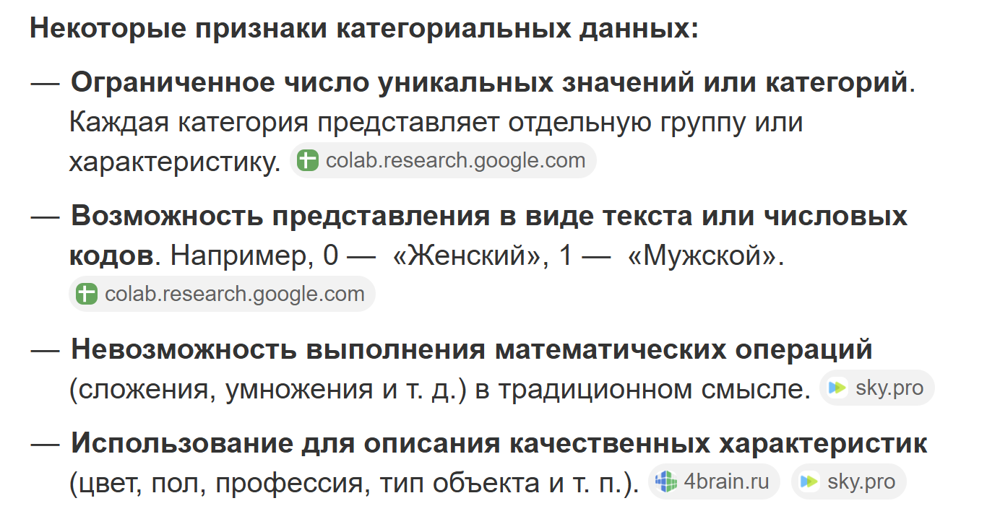

### **Задание 7 (0.3 балла)**

Снова вызовите метод describe и проанализируйте статистики.

**Ответье на вопрос:**
- [+] Есть ли основания предполагать, что заполнение пропусков свдинуло наши распределения? Могло ли это вообще возникнуть?

In [27]:
df_train.describe().round(2)

,year,selling_price,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm
count,5840.00,5840.00,5840.00,5840.00,5840.00,5840.00,5840.00,5840.00,5840.00
mean,2013.43,522960.09,73952.24,19.43,1429.45,87.91,175.23,5.43,3041.65
std,4.10,535432.00,60071.14,3.99,485.66,31.64,107.00,0.98,915.36
min,1983.00,29999.00,1.00,0.00,624.00,0.00,47.04,2.00,500.00
25%,2011.00,250000.00,39000.00,16.95,1197.00,68.00,111.80,5.00,2250.00
50%,2014.00,405000.00,70000.00,19.37,1248.00,81.86,160.00,5.00,3000.00
75%,2017.00,640000.00,100000.00,22.30,1498.00,99.00,200.00,5.00,4000.00
max,2020.00,10000000.00,2360457.00,42.00,3604.00,400.00,1862.00,14.00,21800.00


In [28]:
df_train.shape

(5840, 14)

In [29]:
df_test.shape

(1000, 14)

У нас нет оснований предполагать, что заполнение пропусков изменило распредление

В тренировочном датасете после отсчитки дублей 5840 строк, наибольшее количество пропусков было 202. Доля пропущенных значений меньше 0,05 - что очень мало. Плюс пропуски были заполнены медианой, а не средним
  
В тестовом датасете 1000 строк, и 19 пропусков. Доля попусков 0,019 - тоже очень мало + пропуски заменили на медиану

---
Могли ли возникнуть смещение?  
Да, могло в случах:
- если бы заменили не подходящей статистикой
- если бы было ооочень много пропусков, но тут надо смотреть по ситуации, что значит "много"
- если бы в тесте данные были из другой выборки (изначально с другими распределениями)
- если пропуски не случайны и имеют какую-то логику. Ну кто-то например специально не заполняет какие-то параметры, которые могут удешевлять стоимость авто
- если доля каждой категории автомобилей достаточно большая, то имеет смысл заполнять внутригрупповой статистикой, а не общей по всем датасету
- наличие сезонности может внести коректировки

## **Визуализации и корреляция (4.8 балла + 0.3)**

Визуализация данных — важный шаг в работе. Визуализировать данные необходимо, например, чтобы:

- Оценить распределения признаков самих по себе (это может натоклнуть вас на мысли о модели, которую можно использовать)
- Сравнить распределения на `train` и `test` — чтобы проверить, насколько информация, на которой вы будете обучаться согласуется с той, на которой модель должна работать
- Оценить есть ли явная связь признаков с целевой переменной

**Важно:**

Если распределения на `train` и `test` не совпадают, это не значит, что нужно перемешивать данные! Более корректно актуализировать задачу и уточнить, а не устарели ли данные `train`. Также полезным может быть собрать новую тестовую выборку, смешав те, что имеются сейчас.

**Если вы будете подгонять распределения, то можете встретиться с переобучением!**

### **Задание 8 (1.5 балла)**

Шаг 1.
- [+] Воспользуйтесь `pairplot` из библиотеки `seabron`, чтобы визуализировать попарные распределения числовых признаков для `train`
- [+] По полученному графику ответьте на вопросы:
 - Можно ли предположить на основе распределений связь признаков с целевой переменной?
 - Можно ли предположить на основе распределений выдвинуть гипотезу о корреляциях признаков?

Шаг 2.

- [+] Постройте pairplot по тестовым данным
- [+] Ответьте на вопрос "Похожими ли оказались совокупности при разделении на трейн и тест?"

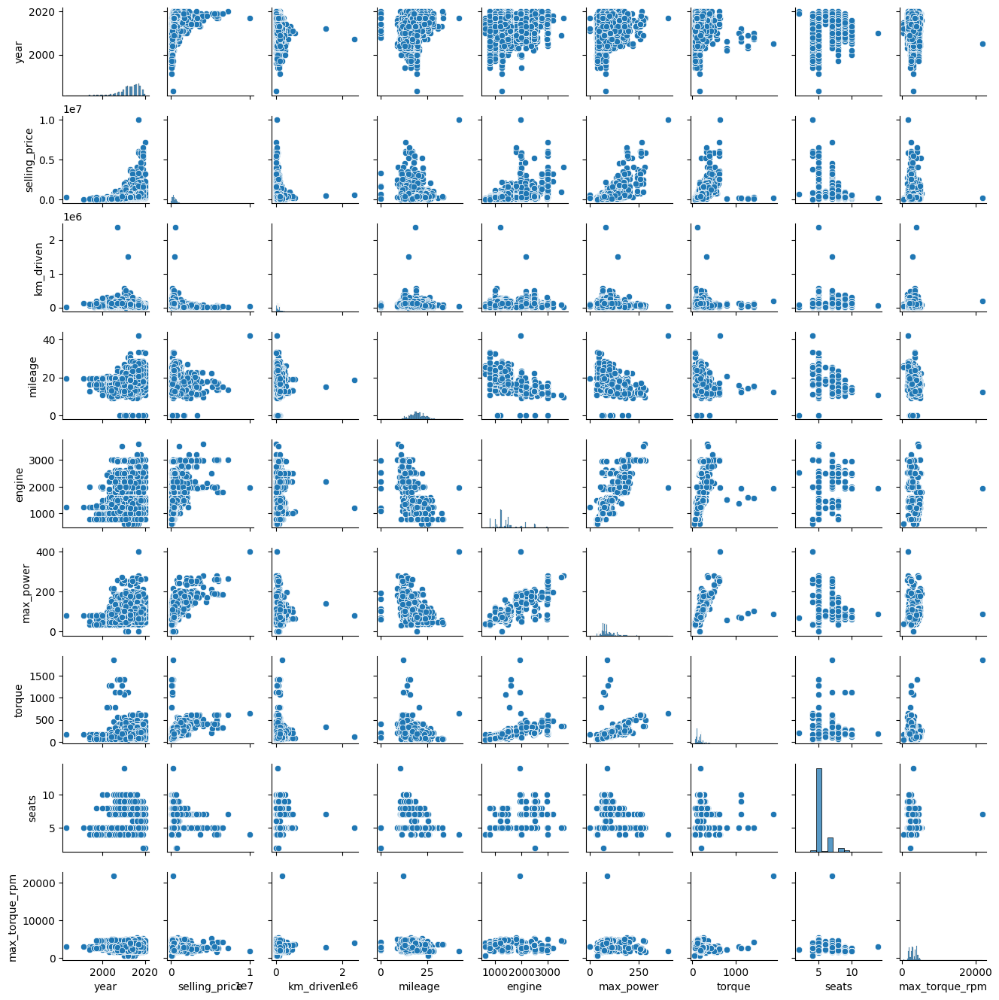

In [30]:
# your code here
sns.pairplot(df_train, height=1.5)
#господи, на сколько это плохая визуализация, выколите мне глаза :)

По данным графикам можно оценить связь признаков с целевой переменной. например, здесь видна положительная корреляция с ценой и годом выпуска: чем недавнее выпущена тачка, тем выше цена, - или с ценой и мощностью
  
Но для признаков, где есть большие выбросы график становится не информативным, т.к.  выброс "прижимает" остальные значения к углу и получается скоплене точек в виде ~линии. Такой пример можно увидеть в паре цена-километраж. Здесь трудно оценить попарное распределение

С помощью pairplot можно оценить корреляцию остальных признаков между собой, Т.к. данный тип визуализации строит распределения всех числовых признаков друг с другом, а не только с целовой переменной

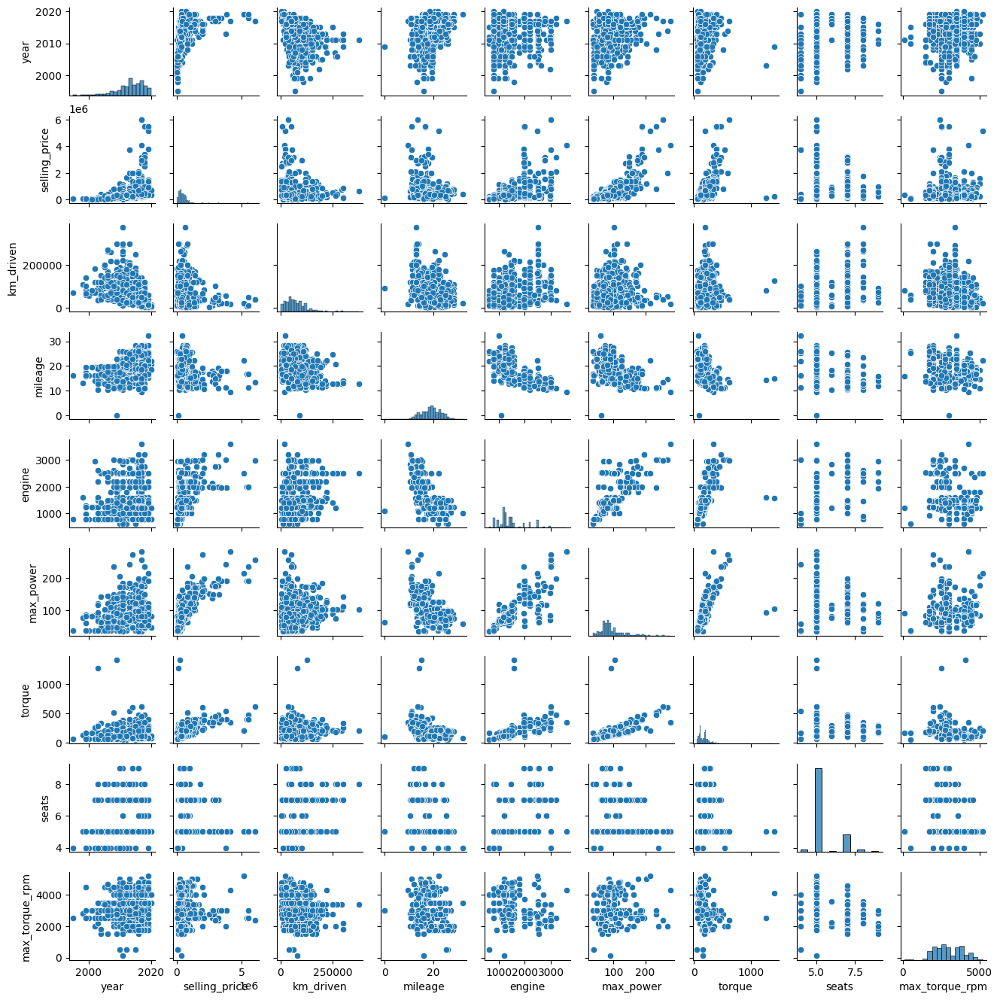

In [31]:
sns.pairplot(df_test, height=1.5)

В целом распределения трейн и тест похожи  
Что лишний раз подтверждает, что они из одной ГС
  
Правда в тесте в признаках максимальный крутящий момент и километраж выбросов меньше, поэтому там лучше выдна корреляция признаков с целевой переменной

### **Задание 9 (1.5 балла)**

Итак, вы выдвинули гипотезы о наличии связи. Теперь давайте оценим эту связь в числах.

**Задание:**
- [+] Получите значения коэффициента корреляции Пирсона для тренировочного набора данных при помощи `pd.corr()`
- [+] По полученным корреляциям постройте тепловую карту (`heatmap` из бибилотеки seaborn)

In [32]:
columns_numb = df_train.select_dtypes(include=['int64','float64']).columns
columns_numb

Index(['year', 'selling_price', 'km_driven', 'mileage', 'engine', 'max_power',
       'torque', 'seats', 'max_torque_rpm'],
      dtype='object')

In [33]:
# your code here
df_train[columns_numb].corr().round(2)

,year,selling_price,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm
year,1.00,0.43,-0.37,0.34,0.00,0.16,0.05,0.04,0.05
selling_price,0.43,1.00,-0.16,-0.10,0.45,0.69,0.47,0.15,-0.08
km_driven,-0.37,-0.16,1.00,-0.18,0.23,0.02,0.11,0.19,-0.20
mileage,0.34,-0.10,-0.18,1.00,-0.57,-0.37,-0.23,-0.45,-0.19
engine,0.00,0.45,0.23,-0.57,1.00,0.68,0.60,0.65,-0.23
max_power,0.16,0.69,0.02,-0.37,0.68,1.00,0.66,0.24,-0.01
torque,0.05,0.47,0.11,-0.23,0.60,0.66,1.00,0.32,-0.26
seats,0.04,0.15,0.19,-0.45,0.65,0.24,0.32,1.00,-0.20
max_torque_rpm,0.05,-0.08,-0.20,-0.19,-0.23,-0.01,-0.26,-0.20,1.00


<Axes: >

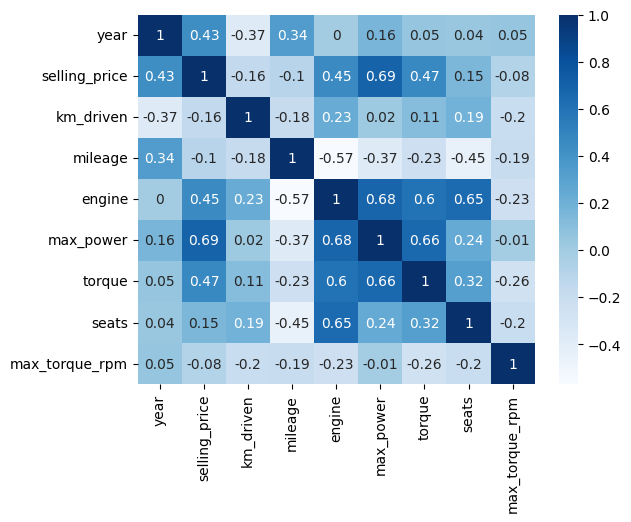

In [34]:
# your code here
sns.heatmap(df_train[columns_numb].corr().round(2),
            annot=True,
            cmap='Blues')

- [+] Ответьте на вопросы:
 - Какие 2 признака наименее скоррелированы между собой?
 - Между какими наблюдается довольно сильная положительная линейная зависимость?
 - Правильно ли, опираясь на данные, утверждать, что чем меньше год, тем, скорее всего, больше километров проехала машина к дате продажи?

Наименнее взаимосвязанных два признака между собой: `engine vs year` - корреляция 0

Сильная положительная корреляция между признаками:
- `max_power vs selling_price` - корреляция 0.69
- `max_power vs engine` - корреляция 0.68
- `max_power vs torque` - корреляция 0.66
- `engine vs seats` - корреляция 0.65
- `engine vs torque` - корреляция 0.60
  
Явно определим, что значит больший/меньший год (простите, но с трактовкой времени я всегда путаюсь): машина 1990- меньшего года выпуска, чем машина 2017 года. 1990- меньший год, чем 2017  
В такой формулировке утверждение корректно. В целом это видим и на графиках в pairplot: спускаемся от 2020г к годам ниже и у таких машин пробег больше

### **Задание 10 (1.8 балла)**

По умолчанию `pd.corr` возвращает корреляцию Пирсона, говорящую о линейной взаимосвязи. Но зависимости существуют не только линейные! В этой задаче попробуйте измерить другие способы вычисления корреляций.

- [+] Реализуйте корреляцию Спирмена/Кендала (на выбор) без использования библиотек (можно пользоваться только `numpy`). Сравните результаты вычисления с библиотечной реализацией

Постройте матрицу корреляции [phik](https://pypi.org/project/phik/)
- [+] Проинтерпретируйте результаты


In [35]:
# your code here

x = df_train['year']
y = df_train['seats']

# Ранги
rank_x = np.argsort(np.argsort(x)) + 1
rank_y = np.argsort(np.argsort(y)) + 1

# Разности рангов
d = rank_x - rank_y

# Формула Спирмена
n = len(x)
rho = 1 - (6 * np.sum(d**2)) / (n * (n**2 - 1))

print(f'Корреляция Спирмена признаков year vs seats равна {rho.round(2)}')

Корреляция Спирмена признаков year vs seats равна 0.05


In [36]:
pip install phik

In [37]:
import phik
df_train.phik_matrix().round(2)

interval columns not set, guessing: ['year', 'selling_price', 'km_driven', 'mileage', 'engine', 'max_power', 'torque', 'seats', 'max_torque_rpm']


/usr/local/lib/python3.12/dist-packages/phik/data_quality.py:59: UserWarning: The number of unique values of variable name is large: 1924. Are you sure this is not an interval variable? Analysis for pairs of variables including name can be slow.
  warnings.warn(


,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats,max_torque_rpm
name,1.00,0.95,0.99,0.00,1.00,0.80,1.00,0.83,1.00,1.00,1.00,1.00,1.00,1.00
year,0.95,1.00,0.22,0.08,0.21,0.23,0.15,0.42,0.28,0.21,0.38,0.19,0.29,0.11
selling_price,0.99,0.22,1.00,0.00,0.16,0.33,0.46,0.56,0.65,0.50,0.87,0.69,0.20,0.07
km_driven,0.00,0.08,0.00,1.00,0.05,0.00,0.01,0.09,0.08,0.21,0.00,0.00,0.10,0.00
fuel,1.00,0.21,0.16,0.05,1.00,0.05,0.05,0.03,0.58,0.64,0.24,0.35,0.45,0.69
seller_type,0.80,0.23,0.33,0.00,0.05,1.00,0.13,0.18,0.06,0.16,0.33,0.15,0.03,0.04
transmission,1.00,0.15,0.46,0.01,0.05,0.13,1.00,0.10,0.33,0.52,0.51,0.36,0.05,0.11
owner,0.83,0.42,0.56,0.09,0.03,0.18,0.10,1.00,0.15,0.19,0.12,0.06,0.05,0.03
mileage,1.00,0.28,0.65,0.08,0.58,0.06,0.33,0.15,1.00,0.59,0.69,0.38,0.68,0.39
engine,1.00,0.21,0.50,0.21,0.64,0.16,0.52,0.19,0.59,1.00,0.72,0.61,0.60,0.47


Корреляция Спирмена (монотонность) и Пирсона(линейность) для признаков `year vs seats` показали корреляцию 0,05 - связь не монотонна и не линейна
  
В свою очередь библиотека Phik показала связь 0,29 - т.е. есть какая связь, но не монотонная и не линейная. Может в какие-то года были популярны модели на N-ое количество дверей, не свойственной для других годов и т.д.

### **Дополнительные визуализации (0.3 балла)**

Если вам кажется, что мы не попросили вас нарисовать какие-то очень важные зависимости, нарисуйте их и поясните.

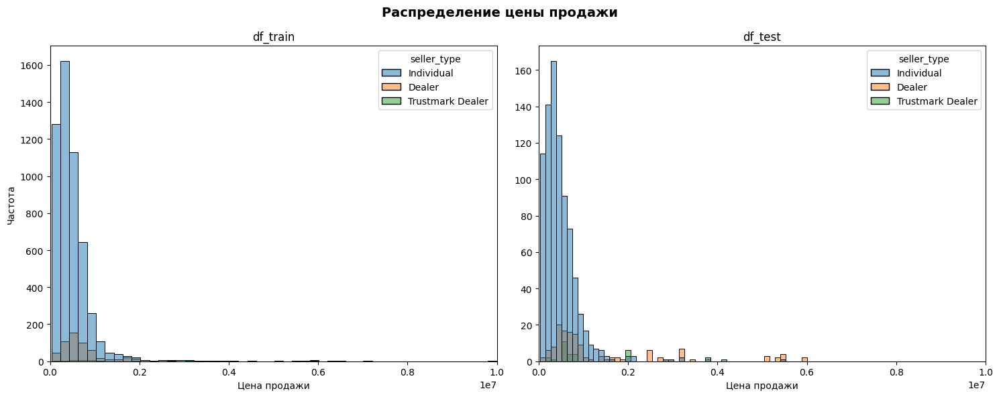

In [38]:
import matplotlib.pyplot as plt
import seaborn as sns

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

# Находим общий максимум для оси x
x_max = max(df_train['selling_price'].max(), df_test['selling_price'].max())

# Гистограмма для train
sns.histplot(data=df_train, x='selling_price', hue='seller_type',
             bins=50, alpha=0.5, ax=ax1)
ax1.set_title('df_train')
ax1.set_xlabel('Цена продажи')
ax1.set_ylabel('Частота')
ax1.set_xlim(0, x_max)  # устанавливаем единый масштаб

# Гистограмма для test
sns.histplot(data=df_test, x='selling_price', hue='seller_type',
             bins=50, alpha=0.5, ax=ax2)
ax2.set_title('df_test')
ax2.set_xlabel('Цена продажи')
ax2.set_ylabel('')
ax2.set_xlim(0, x_max)  # устанавливаем единый масштаб

# Общее название
fig.suptitle('Распределение цены продажи', fontsize=14, fontweight='bold')

plt.tight_layout()
plt.show()

Выводы:
- в обучающей выборке меньше дорогих автомобилей, чем в тестовой -> модель будет хуже предсказывать цену дорогих авто (p.s. это задание с визуалом делаю после реализации задания с апи; у меня ровно этот результат и получился, что для дорогих авто модель сильнее ошибалась, чем для дешевых)
- колонку с ценой можно было попробовать прологарифмировать, чтоб сгладить выбросы
- `Individual` - самый многочисленный сегмент во всех ценовых категориях, `Dealer` - второй по количеству, `Trustmark Dealer` - наименьшая доля. Данный криетрий тоже влияет на качество предсказания модели. Чем меньше сегмент для обучени в выборке тем хуже модель будет предсказывать таргет на реальных данных

# **Часть 2 (4.95+0.45 балла) | Модель только на вещественных признаках**

В этой части вам предстоит обучить модель только на вещественных признаках. Почему только на них?

Чем больше признаковое пространство — чем сложнее модель. А чем модель проще — тем лучше для скорости работы и интерпретации признаков.

За задания этой части вы можете набрать 1.7 основных и 0.15 бонусных балла;

### **Задание 11 (0.15 балла)**

Разбейте данные на тренировочный и тестовый наборы. Перед разбиением создайте копию датафрейма, который будет хранить только вещественные признаки и используйте его (то есть категориальные столбцы (все, кроме seats) необходимо удалить).

В переменные y_train и y_test запишите значения целевых переменных.

In [39]:
from sklearn.model_selection import train_test_split

In [40]:
# Список категориальных колонок (тип object)
categ_clmn = list(df_train.select_dtypes(include=['object']).columns)

# Создаем копии датафреймов
step11_train = df_train.copy()
step11_test = df_test.copy()

# Удаляем категориальные колонки (оставляем только числовые)
step11_train = step11_train.drop(columns=categ_clmn)
step11_test = step11_test.drop(columns=categ_clmn)

# Целевая переменная
y_train = step11_train['selling_price']
# Признаки (все колонки кроме целевой)
X_train = step11_train.drop('selling_price', axis=1)

In [41]:
assert X_train.shape == (5840, 8)

In [42]:
y_test = step11_test['selling_price'] # your code here
X_test = step11_test.drop('selling_price', axis=1)# your code here

In [43]:
assert X_test.shape == (1000, 8)

### **Задание 12. (0.6 балла)**

Построим нашу первую модель!
- [+] Обучите классическую линейную регрессию с дефолтными параметрами. Посчтитайте $R^2$ и $MSE$ для трейна и для теста.
- [+] Сделайте выводы по значениям метрик качества.

**Примечание:**

Здесь и далее $R^2$ и $MSE$ для трейна и для теста выводите везде, где требуется обучать модели, даже если в явном виде этого не просят. Иначе непонятно, как понять, насколько успешны наши эксперименты.

In [44]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error as MSE

# Создаем и обучаем модель линейной регрессии
linear_model_step12 = LinearRegression()
linear_model_step12.fit(X_train, y_train)

# Делаем предсказания
y_pred_train = linear_model_step12.predict(X_train)  # Предсказание для трейна
y_pred_test = linear_model_step12.predict(X_test)    # Предсказание для теста
y_pred_12 = y_pred_test

# Оцениваем качество модели на трейне
r2_train = round(r2_score(y_train, y_pred_train), 4)
mse_train = round(MSE(y_train, y_pred_train), 2)

# Оцениваем качество модели на тесте
r2_test = round(r2_score(y_test, y_pred_test), 4)
mse_test = round(MSE(y_test, y_pred_test), 2)

print(f"Метрики оценки качества модели для трейна: ")
print(f"R^2 = {r2_train}")
print(f"MSE = {mse_train}")

print(f"\nМетрики оценки качества модели для теста: ")
print(f"R^2 = {r2_test}")
print(f"MSE = {mse_test}")

Метрики оценки качества модели для трейна: 
R^2 = 0.6011
MSE = 114334858215.52

Метрики оценки качества модели для теста: 
R^2 = 0.6005
MSE = 229628399881.21


In [45]:
import math
round(math.sqrt(229628399881.21),2)

479195.58

`MSE` - разница между предсказанным значением и истинным, возведенная в квадрат  
`R^2` - какую долю дисперсии (разброса значений относительно среднего) целевой переменной объясняет модель

- MSE Показывает огромную разницу в обоих датасетах. Если взять метрику RMSE для теста/трейна, которая более интерпиритируема из-за одинаковых единиц измерения с реальными, то она равна 479к (для теста). Средняя цена в нашей тестовой группе около 617к. RMSE говорит, что модель может отклонится от срднего значения как в плюс так и в минус на 479к единиц - это много  
- R^2 объясняет лишь 60% факторов разброса цены в автомобилях в обоих выборках. Модель работает не случайно (R^2 = 0), но и далека от идеала (R^2 = 1). Она показывает, что вещественные признаки вносят свой вклад, но, возможно, как раз ей не хватает категориальных признаков для объяснения остальных 20-30% факторов влияния

### **Задание 13 (0.45 балла)**

- [+] Реализуйте $R^2$ руками. Приведите формулу $R^2$ и объясните каждую компоненту метрики

In [47]:
# your code here
r_2_step13 = 1 - (sum((y_test - y_pred_test)**2)) / (sum((y_test - y_test.mean())**2))
round(r_2_step13,2)

0.6

`R^2` - коэффициент детерминации, который объясняет какую долю дисперсии целевой переменной объясняет модель  
`Числитель в формуле` - сумма квадратов ошибок модели (истинное значение минус предсказанное), это то что модель не смогла объяснить  
`Знаменатель в формуле` - сумма квадратов отклонений от среднего (истинное значение минус среднее), разброс целевой переменной

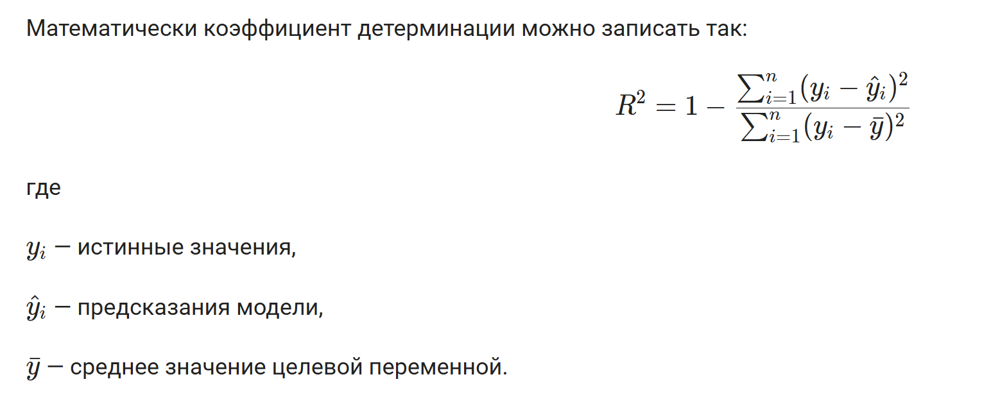

### **Бонус (0.45 балла)**

- [+] Реализуйте [$\text{adjusted}-R^2$](https://en.wikipedia.org/wiki/Coefficient_of_determination).
- [+] Объясните, когда применяется $\text{adjusted}-R^2$?

In [48]:
# your code here
n = X_test.shape[0]
p = X_test.shape[1]

adj_r2 = 1 - (1 - r_2_step13) * ((n - 1) / (n - p - 1))

round(adj_r2, 2)

0.6

я не тру инглиш мен, поэтому за переводом формулы из статьи обратилась к нейронке
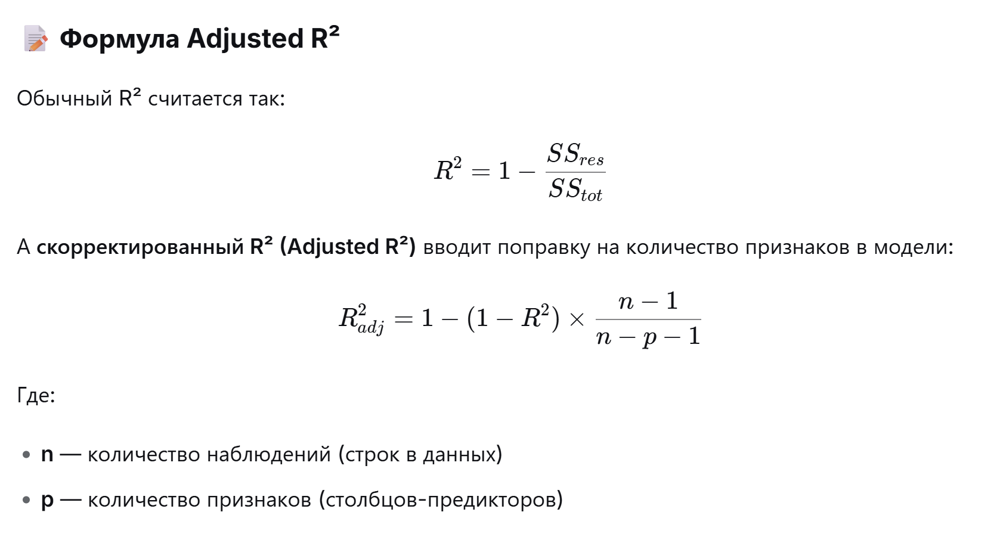


не погружаясь в кулуары математики

скорректированный R^2 с учетом количества признаков в модели
он позволяет:
- адекватнее сравнивать модели с разным количеством признаков
- помогает определить оптимальные признаки, если будут добавляться малоинформативные, то они будут создавать шум в данных и не овысят точность модели
- штрафует за бесполезные признаки в модели, т.к. при добавлени признаков обычный R^2 подвержен переобучению -> коэффициент растет
- лучше его использовать когда признаков много, а объектов нет

скорректированный R^2 защищает от завышений простого R^2

к вопросу как штрафует скорректированный коэффициент нейронка привела прекрасную аналогию, оставлю здесь, чтоб где-то сохранилось

промт был такой: `"а как скорректированный r2 понимает какие признак полезные а какие создают шум?"`

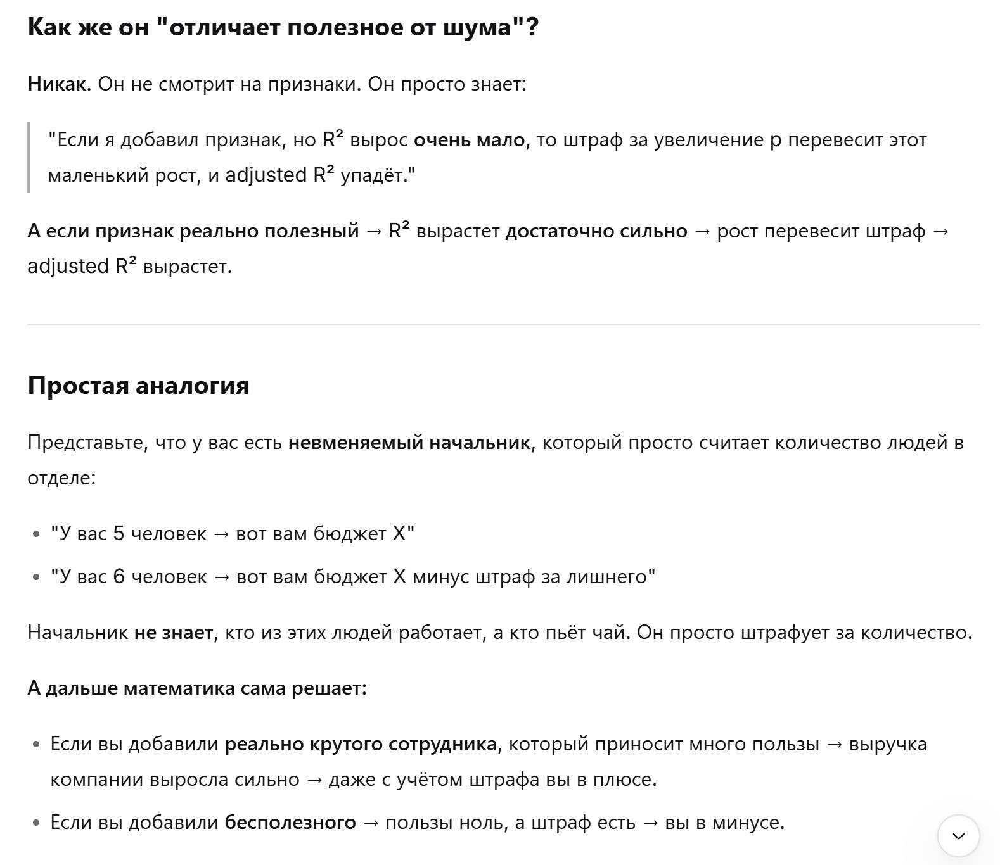

### **Задание 14 (0.45 балла)**

Всегда есть место совершенству. Поэтому давайте попробуем улучшить модель. При помощи стандартизации признаков.

- [+] Стандартизируйте значения в тренировочных и тестовых данных. Стандартизатор **обучайте только на `train`**.

Как изменилось качество модели?

In [49]:
from sklearn.preprocessing import StandardScaler

# Создаем и обучаем стандартизатор на обучающих данных
StandardScaler_model_14 = StandardScaler()
StandardScaler_model_14.fit(X_train)

# Преобразуем признаки в одинаковый масштаб (среднее=0, std=1)
X_train_scaled = StandardScaler_model_14.transform(X_train)
X_test_scaled = StandardScaler_model_14.transform(X_test)

# Обучаем линейную регрессию на стандартизированных признаках
linear_model_step14 = LinearRegression()
linear_model_step14.fit(X_train_scaled, y_train)

# Делаем предсказания
y_pred = linear_model_step14.predict(X_test_scaled)
y_pred_14 = y_pred

# Оцениваем качество
r2_test_step14 = round(r2_score(y_test, y_pred),2)      # Коэффициент детерминации
mse_test_step14 = round(MSE(y_test, y_pred),2)          # Среднеквадратичная ошибка

print(f"Метрики оценки качества модели для теста: ")
print(f"R^2 = {r2_test_step14}")
print(f"MSE = {mse_test_step14}")

Метрики оценки качества модели для теста: 
R^2 = 0.6
MSE = 229628399881.21


Качество никак не изменилось, т.к. масштаб признаков не меняет линейную взаимосвязь

### **Задание 15 (0.3 балла)**

Хотя стандартизация не помогла сильно прибавить в качестве, она открыла возможность интерпретировать важность признаков в модели. Правило интерпретации такое:

Чем больше коэффициент $\beta_i$ по модулю, тем важнее признак.

**Ответьте на вопрос:**

- [+] Какой признак оказался наиболее информативным в предсказании цены?

In [50]:
# your code here
abs(linear_model_step14.coef_.round())

array([165621.,  48680.,   8488.,  23124., 329152.,   7356.,  30327.,
        58734.])

In [51]:
X_train.columns

Index(['year', 'km_driven', 'mileage', 'engine', 'max_power', 'torque',
       'seats', 'max_torque_rpm'],
      dtype='object')

Наиболее информативный признак `year`, его коэффициент равен 165.621

### **Задание 16 (0.75 балла)**

Попробуем улучшить нашу модель с помощью применения регуляризации. Для этого воспльзуемся `Lasso` регрессией.  Кроме того, попробуйте использовать её теоретическое свойство отбора признаков, за счет зануления незначимых коэффициентов.

**Задание:**

- [+] Обучите Lasso регрессию на тренировочном наборе данных с нормализованными признаками. Оцените её качество
- [+] Проверьте, занулила ли L1-регуляризация с параметрами по умолчанию какие-нибудь веса? Предположите почему.

In [52]:
from sklearn.linear_model import Lasso

# Создаем и обучаем модель Lasso-регрессии (L1-регуляризация)
lasso_model_16 = Lasso()
lasso_model_16.fit(X_train_scaled, y_train)

# Делаем предсказания на тестовых данных
y_pred = lasso_model_16.predict(X_test_scaled)
y_pred_16 = y_pred

# Оцениваем качество модели
r2_test_step16 = round(r2_score(y_test, y_pred),2)      # Коэффициент детерминации
mse_test_step16 = round(MSE(y_test, y_pred),2)          # Среднеквадратичная ошибка

print(f"Метрики оценки качества модели для теста: ")
print(f"R^2 = {r2_test_step16}")
print(f"MSE = {mse_test_step16}")

Метрики оценки качества модели для теста: 
R^2 = 0.6
MSE = 229629135201.52


In [53]:
abs(lasso_model_16.coef_)

array([165618.86153319,  48678.8342968 ,   8484.33100353,  23122.32505043,
       329153.16439895,   7355.63028754,  30322.99923828,  58732.09322758])

Качество модели такое же как в предыдущих двух моделях

Лассо не занулила коэффициенты -> все коэф.важны и оказывают влияние на стоимость автомобиля  
  
Еще почитала, что параметр `alpha` маленький, по дефолту он равен 1, его можно увеличить, чтоб штрафовать модель сильнее. Если поставить альфу 15к, то уже появляются нулевые коэф., но опять же не погружаясь сильно в матан и конкретный разбор я пока не оч понимаю как это работает)

### **Задание 17. Финальный рывок (1.2 балла)**

До этого мы с вами использовали `train` для обучения и `test` для прогнозирования. Но у нас есть ещё одна задача — подобрать оптимальные параметры модели. Для этого используем кросс-валидацию.

Кроме того, выжмем максимум из модификаций регрессии. Построим `ElasticNet`. И сделаем всё по порядку.

**Ваша задача 1:**

- [+] Перебором по сетке (c десятью фолдами) подберите оптимальные параметры для Lasso-регрессии. Вам пригодится класс [GridSearchCV](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html).
- [+] Ответьте на вопросы:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Что значит каждый параметр `param_grid`, который вы заполняли для `GridSearch`? Опишите каждый
 - Какой коэффициент регуляризации у лучшей из перебранных моделей? Занулились ли какие-нибудь из весов при такой регуляризации?

In [54]:
# Импортируем GridSearchCV для подбора гиперпараметров
from sklearn.model_selection import GridSearchCV

# Количество фолдов для кросс-валидации
cv=10

# Сетка гиперпараметров для перебора
params = {
    'alpha': [10, 100, 1000, 10000, 11000, 11500, 12000, 12500, 13000, 13500, 14000],  # Сила регуляризации
    'warm_start': [True, False],           # Использовать ли предыдущие веса для инициализации
    'max_iter': [100, 800, 1000, 1500, 2000]  # Максимальное количество итераций
}

# Создаем и запускаем GridSearch с Lasso
grid_search = GridSearchCV(estimator=Lasso(), param_grid=params, cv=cv)
grid_search.fit(X_train_scaled, y_train)

# Предсказываем на тестовых данных
y_pred = grid_search.predict(X_test_scaled)
y_pred_17_1 = y_pred

# Оцениваем качество
r2_test_step17 = round(r2_score(y_test, y_pred),2)      # Коэффициент детерминации
mse_test_step17 = round(MSE(y_test, y_pred),2)          # Среднеквадратичная ошибка

print(f"Метрики оценки качества модели для теста: ")
print(f"R^2 = {r2_test_step17}")
print(f"MSE = {mse_test_step17}")

Метрики оценки качества модели для теста: 
R^2 = 0.58
MSE = 239874577072.1


In [55]:
# Лучшая модель после подбора гиперпараметров
grid_search.best_estimator_

Lasso(alpha=14000, max_iter=100, warm_start=True)

In [56]:
# Абсолютные значения коэффициентов лучшей модели Lasso
# Чем больше коэффициент, тем сильнее признак влияет на цену
abs(grid_search.best_estimator_.coef_)

array([151634.60058607,  34628.1916218 ,      0.        ,      0.        ,
       332902.98619316,    971.02953884,      0.        ,  40684.18396724])

In [57]:
# Подсчет общего количества обученных моделей при GridSearch
len(params['alpha']) * len(params['warm_start']) * len(params['max_iter']) * cv

1100

- Грид-серч обучил 1100 моделей
- `param_grid` - это параметры, которые имеет сама модель. В нашем случае идем в документацию Lasso() и смотрим какие параметры можем использовать, нужны и передаем в param_grid. В задании использованы параметры
  - **alpha** - сила штрафа для весов (коэф.регуляризации)
  - **warm_start** - не забывает прошлые коэф.модели и продолжает их улучшать, если модель большая, то позволяет с перебором параметров не с начала их считать, а как бы продолжает со старых просчет. Важно соблюдать монотонность при указании значений в параметрах
  - **max_iter** - кол-во попыток для модели, за которые она должна найти лучшие коэффициенты. Если признаков много, то модели может не хватить дефолтного значения шагов (1000) для подбора оптимальных коэф., тогда будет ошибка о несходимости
- лучший коэф. alpha = 14000. Занулилось три коэффициента

**Ваша задача 2:**

- [+] Перебором по сетке (c десятью фолдами) подберите оптимальные параметры для [ElasticNet](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.ElasticNet.html) регрессии.
- [+] Ответьте на вопрос:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Какие гиперпараметры соответствуют лучшей (по выбранной метрике качества) из перебранных моделей?

In [58]:
# Импортируем ElasticNet (комбинация L1 и L2 регуляризации)
from sklearn.linear_model import ElasticNet

# Создаем модель ElasticNet
model = ElasticNet()

# Количество фолдов для кросс-валидации
cv=10

# Сетка гиперпараметров для перебора
param_grid={
    'alpha': [13000, 13500, 14000],                    # Сила регуляризации
    #кек прикол, для чистого ridge (l1_ratio=0) модель не сходится даже с 50к иттерациями
    'l1_ratio': [0.0001, 0.1, 0.2, 0.3, 0.5, 0.7, 0.9, 0.95, 0.99, 1],  # Пропорция между L1 и L2 (0 = чисто Ridge, 1 = чисто Lasso)
    'warm_start': [True, False],                       # Использовать ли предыдущие веса
    'max_iter': [800, 1000, 3000, 5000]                # Максимальное количество итераций
}

# Создаем и запускаем GridSearch с метрикой R^2
grid_search = GridSearchCV(
    estimator=model,
    param_grid=param_grid,
    scoring='r2',     # Метрика для оценки качества
    cv=cv)

# Обучаем модель с подбором гиперпараметров
grid_search.fit(X_train_scaled, y_train)

# Предсказываем на тестовых данных
y_pred = grid_search.predict(X_test_scaled)

# Сохраняем предсказания
y_pred_17_2 = y_pred

# Оцениваем качество модели
r2_test_step17_2 = round(r2_score(y_test, y_pred),2)      # Коэффициент детерминации
mse_test_step17_2 = round(MSE(y_test, y_pred),2)          # Среднеквадратичная ошибка

print(f"Метрики оценки качества модели для теста: ")
print(f"R^2 = {r2_test_step17_2}")
print(f"MSE = {mse_test_step17_2}")

Метрики оценки качества модели для теста: 
R^2 = 0.58
MSE = 239874577072.1


In [59]:
# Выводит лучшую модель с подобранными гиперпараметрами
# Параметры, которые совпали со значениями по умолчанию, могут не отображаться
grid_search.best_estimator_

ElasticNet(alpha=14000, l1_ratio=1, max_iter=800, warm_start=True)

In [60]:
# Подсчет общего количества обученных моделей при GridSearch для ElasticNet
len(param_grid['alpha']) * len(param_grid['warm_start']) * len(param_grid['max_iter']) * len(param_grid['l1_ratio']) * cv

2400

In [61]:
# Лучший результат R^2 на кросс-валидации (среднее по всем фолдам)
grid_search.best_score_

np.float64(0.5821708676111256)

- Грид-серч обучил 2400 моделей
- лучшие параметры:
  - alpha=14000,
  - l1_ratio=1,  (чистый Лассо лучше всего работает на наших данных)
  - max_iter=800,
  - warm_start=True

### **Задание 18 (1.05 балла)**

Итак, вы обучили все варианты регуляризаций, доступные в sklearn, но есть и другие варианты! И следующее задание о забытой $L0$ регуляризации.


**Ваша задача:**>
- [+] Реализуйте модель с $L0$-регуляризаицей.
- [+] Обучите модель на данных и проанализируйте результат, экспериментируя с коэффициенитом регуляризации
- [+] Проанализируйте результаты обучения

**Важно:**

Вопреки тому, что L0 не реализована в стандартных пакетах, концепция данной регуляризации не является мертвой. Она может встречаться в [статьях](https://arxiv.org/abs/1712.01312) и экспериментах.



In [62]:
pip install git+https://github.com/TheoGuyard/El0ps.git

  Cloning https://github.com/TheoGuyard/El0ps.git to /tmp/pip-req-build-18c4rf4x
  Running command git clone --filter=blob:none --quiet https://github.com/TheoGuyard/El0ps.git /tmp/pip-req-build-18c4rf4x
  Resolved https://github.com/TheoGuyard/El0ps.git to commit b9f766fd908b0dcf446c0bb1366ba7faeed97bce
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


In [63]:
# your code here
# вот отсюда достали библиотеку и нужный класс https://github.com/TheoGuyard/El0ps/blob/main/src/el0ps/estimator/regressor.py
from el0ps.estimator import L0Regressor

# Создаем модель L0-регрессии
# lmbd=0.01 - коэффициент регуляризации (λ), контролирует штраф за количество ненулевых признаков
# M=1.0 - ограничение максимального значения коэффициентов: ||x||_∞ ≤ M
model = L0Regressor(lmbd=0.01, M=1.0)

# Обучаем модель на стандартизированных признаках
model.fit(X_train_scaled, y_train)

# Делаем предсказание на тестовых данных
y_pred = model.predict(X_test_scaled)
y_pred_18 = y_pred

# Оцениваем качество модели
r2_test_step18 = round(r2_score(y_test, y_pred),2)      # Коэффициент детерминации R²
mse_test_step18 = round(MSE(y_test, y_pred),2)          # Среднеквадратичная ошибка MSE

print(f"Метрики оценки качества модели для теста: ")
print(f"R^2 = {r2_test_step18}")
print(f"MSE = {mse_test_step18}")

Метрики оценки качества модели для теста: 
R^2 = -0.66
MSE = 956625846299.03


In [64]:
# Не поверила, что все так плохо, поэтому прогнала через цикл... GridSearch не работает с L0Regressor

best_r2 = -np.inf          # Лучший коэффициент детерминации (начинаем с минимального)
best_params = None         # Словарь с лучшими гиперпараметрами
best_model = None          # Лучшая обученная модель

# Перебираем силу регуляризации lmbd
for lmbd in [0.0001, 0.001, 0.005, 0.01, 0.05, 0.1, 0.5]:
    # Перебираем ограничение на максимальное значение коэффициентов M
    for M in [0.5, 1.0, 2.0, 5.0, 10.0]:
        # Создаем модель с текущими параметрами
        model = L0Regressor(lmbd=lmbd, M=M)
        # Обучаем модель
        model.fit(X_train_scaled, y_train)
        # Предсказываем на тестовых данных
        y_pred = model.predict(X_test_scaled)
        # Вычисляем R^2
        r2 = r2_score(y_test, y_pred)

        # Если нашли лучшее значение R^2, запоминаем параметры и модель
        if r2 > best_r2:
            best_r2 = r2
            best_params = {'lmbd': lmbd, 'M': M}
            best_model = model

# Выводим лучшие параметры и соответствующий R^2
print(f"Лучшие параметры: {best_params}")
print(f"Лучший R^2 на тесте: {best_r2:.4f}")

# Метрики лучшей модели
y_pred_best = best_model.predict(X_test_scaled)
r2_test_step18 = round(r2_score(y_test, y_pred_best), 2)      # Коэффициент детерминации лучшей модели
mse_test_step18 = round(MSE(y_test, y_pred_best), 2)          # Среднеквадратичная ошибка лучшей модели

print(f"R^2 = {r2_test_step18}")
print(f"MSE = {mse_test_step18}")

Лучшие параметры: {'lmbd': 0.0001, 'M': 10.0}
Лучший R^2 на тесте: -0.6641
R^2 = -0.66
MSE = 956586184544.58


По результатом можно сказать, что модель хуже предсказывает значения, чем если бы взяли среднее
  

Почему?  
Хороший вопрос  
Для ответа на него, явно, нужно в матане поразбираться. Времени на этот пункт нет)

# **Часть 3 (1.5 балла) | Добавляем категориальные фичи**

Попробуем для улучшения модели дать ей больше признаков. Добавим категориальные фичи.

За эту часть можно набрать 0.5 основных балла.



### **Задание 19 (0.3 балла)**

Проанализируйте столбец `name`. Очевидно, что эта переменная является категориальной, однако категорий в ней много.

- [+] Предобработайте столбец `name`, чтобы избежать его удаления

In [65]:
# Создаем копии датафреймов для работы с категориальными признаками
df_train_step19 = df_train.copy()
df_test_step19 = df_test.copy()

# Извлекаем бренд автомобиля (первое слово из названия)
df_train_step19['name'] = df_train_step19['name'].str.split().str[0]
df_test_step19['name'] = df_test_step19['name'].str.split().str[0]

# Формируем матрицу признаков X (все колонки кроме целевой)
X_train_cat = df_train_step19.drop(['selling_price'], axis=1)
X_test_cat = df_test_step19.drop(['selling_price'], axis=1)

# Формируем целевую переменную y
y_train_cat = df_train_step19['selling_price']
y_test_cat = df_test_step19['selling_price']

In [66]:
assert X_train_cat.shape == (5840, 13)

In [67]:
X_train_cat.describe(include='object')

,name,fuel,seller_type,transmission,owner
count,5840,5840,5840,5840,5840
unique,30,4,3,2,5
top,Maruti,Diesel,Individual,Manual,First Owner
freq,1804,3177,5223,5336,3603


### **Задание 20 (0.3 балла)**

- [+] Закодируйте категориалльные фичи и ``seats`` методом OneHot-кодирования.

In [68]:
from sklearn.preprocessing import OneHotEncoder  # One-hot кодирование для категориальных признаков
from pandas import get_dummies  # Альтернатива, но с ней не все гладко работает
import scipy.sparse as sp  # Для работы с разреженными матрицами

# Определяем категориальные колонки (object) + добавляем 'seats'
col = X_train_cat.select_dtypes(['object']).columns.tolist() + ['seats']
# Числовые колонки (все остальные)
num_cols = X_train_cat.drop(columns=col).columns.tolist()

# Создаем OneHotEncoder: drop='first' убирает мультиколлинеарность, handle_unknown='ignore' игнорирует новые категории в тесте
ohe = OneHotEncoder(drop='first', handle_unknown='ignore')
# Обучаем на категориальных признаках из train
ohe.fit(X_train_cat[col])

# Преобразуем категориальные признаки в разреженные матрицы (one-hot кодирование)
X_train_dummies = ohe.transform(X_train_cat[col])
X_test_dummies  = ohe.transform(X_test_cat[col])

# Стандартизируем числовые признаки
scaler = StandardScaler()
# Преобразуем в разреженную матрицу для совместимости с one-hot матрицами
X_train_num = sp.csr_matrix(scaler.fit_transform(X_train_cat[num_cols]))
X_test_num  = sp.csr_matrix(scaler.transform(X_test_cat[num_cols]))

# Объединяем числовые и категориальные признаки по горизонтали в одну разреженную матрицу
X_train_full = sp.hstack([X_train_num, X_train_dummies])
X_test_full  = sp.hstack([X_test_num,  X_test_dummies])

/usr/local/lib/python3.12/dist-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [0] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


### **Задание 21 (0.6 балла)**

OHE — базовый алгоритм преобразования категориальных признаков, но и с ним нужно быть аккуратными.

**Ответьте на вопросы:**


* Как корректно работать с OHE преобразованием?
* Почему мы удаляем один столбец?
* Пусть из $n$ признаков мы получили $n-1$ столбец, из которых $k < n -1$ оказались не важными по весам модели. Корректно ли их удалить?

- ohe нужно обучать на тренировочных данных, затем обученную модель модель применять к тесту. Есл в тесте встречается признак которого не было в трейне, то используется параметр `handle_unknow='ignore'`. Если после OHE появялется много новых признаков, то другие способы обработки данных, т.к. большое количество признаков также усложняет модель и на небольшом количесте данных это не лучший вариант
- один столбец, который раскладывается на несколько признаков, удаляется, чтоб не было мультиколлинеарности. Матрица будет вырожденной и алгоритм не сможет однозначно найти веса. Удалние одного исходного столбца не влияет на качество модели, т.к. преобразованные колонки все вместе несут ту же информацию. Для удаления используется параметр `drop='first'`
- удалять признаки нельзя, т.к. мы теряем информацию, не можем восстановить исходный признак. Если признак имеет маленький вес, то его можно обработать до OHE, например, объеденить с другими малозначимыми признаками в категорию other

### **Задание 22 (0.3 балла)**
Повторим то, что делали на прошлом шаге для моделей на вещественных признаках, однако теперь с моделью `Ridge`.


**Ваша задача:**
- [+] Переберите параметр регуляризации `alpha` для гребневой (ridge) регрессии с помощью класса `GridSearchCV` В качестве параметров при объявлении GridSearchCV кроме модели укажите метрику качества $R^2$. Кроссвалидируйтесь по 10-ти фолдам.
- [+] Ответье на вопрос: Удалось ли улучшить качество прогнозов?

In [69]:
from sklearn.linear_model import Ridge  # Ридж-регрессия (L2-регуляризация)
from sklearn.model_selection import GridSearchCV  # Подбор гиперпараметров

# Создаем модель Ридж-регрессии
model = Ridge()
cv = 10  # Количество фолдов для кросс-валидации

# Сетка гиперпараметров для перебора
grid_param = {'alpha': [0.1, 1, 100, 1000, 5000, 13000]}  # Сила регуляризации

# Создаем GridSearch с метрикой R^2
grid_search = GridSearchCV(estimator=model, param_grid=grid_param, cv=cv, scoring='r2')

# Обучаем модель с подбором гиперпараметров на полном наборе признаков
grid_search.fit(X_train_full, y_train_cat)

# Делаем предсказание на тестовых данных
y_pred = grid_search.predict(X_test_full)
y_pred_22 = y_pred

# Оцениваем качество модели
r2_test_step22 = round(r2_score(y_test, y_pred), 2)   # Коэффициент детерминации
mse_test_step22 = round(MSE(y_test, y_pred), 2)       # Среднеквадратичная ошибка

print(f"Метрики оценки качества модели для теста: ")
print(f"R^2 = {r2_test_step22}")
print(f"MSE = {mse_test_step22}")

Метрики оценки качества модели для теста: 
R^2 = 0.78
MSE = 125044782076.75


In [70]:
# Лучшая модель Ridge после подбора гиперпараметров (с оптимальным alpha)
grid_search.best_estimator_

Ridge(alpha=1)

Качество модели стало заметно лучше!

Качество улучшилось на 18-20 п.п. и модель стала лучше объяснять дисперсию цены. Метрики качества явно говорят, что категориальные данные хорошо объясняют цену и являются значимыми признаками

# **Часть 4 - бонусная (3 балла) | Feature Engineering**

В этой части домашнего задания вам предлагается проявить свою креативность для улучшения прогноза модели. Любые другие модели, кроме различных форм линейной (или полиномиальной) регресси, использовать запрещается. А значит, придется работать с признаками

**Что можно попробовать сделать?** (каждый уникальный пункт по 0.6 балла, но не больше трех баллов в сумме)

1.   *Сгенерировать новые признаки на основе уже существующих:*

  * посчитать произведения // частные признаков (кажется, что посчитать число "лошадей" на литр объема может быть полезно);
  * имеет смысл обратить внимание на визуализации в части с EDA (к примеру, зависимость цены от года выглядит квадратичной, а не линейной; значит, квадрат года нам, скорее всего, принесет больше пользы)

2.   *Добыть новые признаки:*

  * имеем название автомобиля, которое никак не используем (можно спарсить инфу о классе автомобиля или каких-то специфических опциях)
  * можно добавить пороговые признаки вроде "владелец третий или больше" и объединить признаки в некоторые осмысленные правила, например "первый или второй владелец и продавец официальный дилер" (подбирать пороги удобно по диаграммам рассеяния)

3.   *Поработать с уже имеющимися:*

  * далеко не факт, что заполнить пропуск медианой было лучшей идеей (как минимум, можно добавить dummy-столбец для модели, сигнализирующий, что раньше на месте медианы был пропуск -- там где он был, конечно); попробуйте другие способы филлинга;
  * мы не анализировали, есть ли в данных выбросы => никак выбросы не обрабатывали; наиболее простым и, тем не менее, довольно полезным вариантом нахождения выбросов могут послужить boxplot'ы для каждого столбца; что делать с выбросами думайте сами :) -- вариантов довольно много
  * мы толком не смотрели на таргет сам по себе; в нем тоже могут быть неожиданности -- стоит хотя бы проверить
  * можно заметить, что некоторые признаки распределены совсем не нормально; возможно их стоит отлогарифмировать

И так далее...

Feel Free to Try!

В этом пункте также оценивается целесообразность и пояснение выбранного вами метода или методов.

In [ ]:
# your code here

`Your answer here`

# **Часть 4. | Бизнесовая (1.75 балла)**

### **Задание 23 (0.75 балла)**

В мире бизнеса очень важно давать оценку качества модели, понятную бизнесу, поэтому иногда заказчики приходят с кастомными метриками. Попробуем сделать такую для нашей задачи.

**Описание метрики:**

Среди всех предсказанных цен на авто нужно посчитать долю прогнозов, отличающихся от реальных цен на эти авто не более чем на 10% (в одну или другую сторону)

**Ваша задача:**

- [+] Реализуйте метрику `business_metric`
- [+] Посчитайте метрику для всех обученных моделей и определеите, которая лучше всего решает задачу бизнеса

In [71]:
def business_metrics(y_true, y_pred):
    # your code here

    relative_error = np.abs((y_true - y_pred) / y_true)
    return np.mean(relative_error <= 0.1)


print("Бизнес-метрика (доля прогнозов с ошибкой <= 10%):")
print(f"LinearRegression (только вещ.): {business_metrics(y_test, y_pred_12):.2f}")
print(f"LinearRegression (только вещ. + стандартизатор): {business_metrics(y_test, y_pred_14):.2f}")
print(f"Lasso (только вещ. + стандартизатор): {business_metrics(y_test, y_pred_16):.2f}")
print(f"Lasso (только вещ. + стандартизатор + перебор параметров): {business_metrics(y_test, y_pred_17_1):.2f}")
print(f"ElasticNet (только вещ. + стандартизатор + перебор параметров): {business_metrics(y_test, y_pred_17_2):.2f}")
print(f"L0Regressor (только вещ. + стандартизатор + перебор параметров): {business_metrics(y_test, y_pred_18):.2f}")
print(f"Ridge (стандартизатор + ohe + перебор параметров): {business_metrics(y_test, y_pred_22):.2f}")

Бизнес-метрика (доля прогнозов с ошибкой <= 10%):
LinearRegression (только вещ.): 0.24
LinearRegression (только вещ. + стандартизатор): 0.24
Lasso (только вещ. + стандартизатор): 0.24
Lasso (только вещ. + стандартизатор + перебор параметров): 0.24
ElasticNet (только вещ. + стандартизатор + перебор параметров): 0.24
L0Regressor (только вещ. + стандартизатор + перебор параметров): 0.00
Ridge (стандартизатор + ohe + перебор параметров): 0.31


Лучшая модель по бизнес-метрике - Ridge (стандартизатор + ohe + перебор параметров), ее доля прогнозов в ошибкой <= 10% составляет 0.31. Это значительно лучше, чем остальные модели, которые имеют долю равную 0.24

### **Задание 24 (1 балл)**

Но у бизнеса не всегда есть идеи и иногда задача на выбор метрики делегируется вам.

**Задание:**

- [+] Придумайте и реализуйте другую кастомную метрику с учетом того, что модель не должна сильно ошибаться в прогнозе, но недопрогноз для модели, согласно мнению бизнеса, хуже, чем перепрогноз.
- [+] Посчитайте метрику для всех обученных моделей и определеите, которая лучше всего решает задачу бизнеса



In [72]:
def your_business_metrics(y_true, y_pred):
    relative_error = (y_true - y_pred) / y_true  # >0 = недопрогноз, <0 = перепрогноз
    weights = np.where(relative_error > 0, 2.0, 1.0)  # недопрогноз штрафуем сильнеее

    # средневзвешенная ошибака
    weighted_error = weights * np.abs(relative_error) # берём модуль ошибки (чтоб оба типа ошибок были положительными) и умножаем на вес штрафа

    return 1 - np.mean(weighted_error) #точность модели с учетом штрафа за недопрогноз


print("Бизнес-метрика (точность модели с учетом штрафа за недопрогноз):")
print(f"LinearRegression (только вещ.): {your_business_metrics(y_test, y_pred_12):.2f}")
print(f"LinearRegression (только вещ. + стандартизатор): {your_business_metrics(y_test, y_pred_14):.2f}")
print(f"Lasso (только вещ. + стандартизатор): {your_business_metrics(y_test, y_pred_16):.2f}")
print(f"Lasso (только вещ. + стандартизатор + перебор параметров): {your_business_metrics(y_test, y_pred_17_1):.2f}")
print(f"ElasticNet (только вещ. + стандартизатор + перебор параметров): {your_business_metrics(y_test, y_pred_17_2):.2f}")
print(f"L0Regressor (только вещ. + стандартизатор + перебор параметров): {your_business_metrics(y_test, y_pred_18):.2f}")
print(f"Ridge (стандартизатор + ohe + перебор параметров): {your_business_metrics(y_test, y_pred_22):.2f}")

Бизнес-метрика (точность модели с учетом штрафа за недопрогноз):
LinearRegression (только вещ.): 0.04
LinearRegression (только вещ. + стандартизатор): 0.04
Lasso (только вещ. + стандартизатор): 0.04
Lasso (только вещ. + стандартизатор + перебор параметров): 0.11
ElasticNet (только вещ. + стандартизатор + перебор параметров): 0.11
L0Regressor (только вещ. + стандартизатор + перебор параметров): -1.00
Ridge (стандартизатор + ohe + перебор параметров): 0.35


Мы видим, что модель Ridge (стандартизатор + ohe + перебор параметров) по метрике "точность модели с учетом штрафа за недопрогноз" показала лучший результат по сравнению с остальными моделями. Данная модель лучше определяет таргет с учетом более сильного штрафа за недопрогноз

Значения метрики "точность модели с учетом штрафа за недопрогноз"
- 1 - модель точно определяет таргет (когда все ошибкии = 0)
- <= 0 - модель ужасна, ошибки могут быть огромными и их много

# **Часть 5 (15.5 баллов) | Реализация сервиса на FastAPI**

### **Задание 25 (11 баллов)**

Cделайте с помощью FastAPI сервис, который с точки зрения пользователя реализует две функции:

1. на вход в формате json подаются признаки одного объекта, на выходе сервис выдает предсказанную стоимость машины
2. на вход подается csv-файл с признаками тестовых объектов, на выходе получаем файл с +1 столбцом - предсказаниями на этих объектах

С точки зрения реализации это означает следующее:
- средствами pydantic должен быть описан класс базового объекта
- класс с коллецией объектов
- метод post, который получает на вход один объект описанного класса
- метод post, который получает на вход коллекцию объектов описанного класса

Шаблон для сервисной части дан ниже. Код необходимо дополнить и оформить в виде отдельного .py-файла.

In [73]:
import pickle  # Для сохранения объектов (модели, трансформеров, медиан и т.д.)

# Медианы считаем ДО fillna, на трейне (для заполнения пропусков в тесте)
medians = {
    'mileage':        df_train['mileage'].median(),          # Медиана расхода топлива
    'engine':         df_train['engine'].median(),           # Медиана объема двигателя
    'max_power':      df_train['max_power'].median(),        # Медиана максимальной мощности
    'torque':         df_train['torque'].median(),           # Медиана крутящего момента
    'seats':          df_train['seats'].median(),            # Медиана количества мест
    'max_torque_rpm': df_train['max_torque_rpm'].median(),   # Медиана оборотов макс. крутящего момента
}

# Сохраняем словарь с медианами
with open('medians.pkl', 'wb') as f:
    pickle.dump(medians, f)

# Сохраняем обученный OneHotEncoder
with open('ohe.pkl', 'wb') as f:
    pickle.dump(ohe, f)

# Сохраняем обученный стандартизатор (StandardScaler)
with open('scaler.pkl', 'wb') as f:
    pickle.dump(scaler, f)

# Сохраняем лучшую модель после GridSearch
with open('model.pkl', 'wb') as f:
    pickle.dump(grid_search.best_estimator_, f)

# Сохраняем список категориальных колонок для OHE (чтобы порядок колонок совпадал)
with open('col.pkl', 'wb') as f:
    pickle.dump(col, f)          # cat_cols для OHE

# Сохраняем список числовых колонок
with open('num_cols.pkl', 'wb') as f:
    pickle.dump(num_cols, f)     # числовые колонки

In [74]:
# Установка необходимых библиотек для создания и запуска API веб-сервиса
# fastapi - современный веб-фреймворк для создания API
# uvicorn - ASGI сервер для запуска FastAPI приложений
# python-multipart - для обработки multipart/form-data (загрузка файлов)
# pyngrok - для создания публичного туннеля к локальному серверу (доступ из интернета)
# nest-asyncio - для работы асинхронного кода в Jupyter/Colab
!pip install fastapi uvicorn python-multipart pyngrok nest-asyncio

In [75]:
# Сохраняем следующий код в файл main.py
%%writefile main.py

import pickle
import io
import re
import numpy as np
import pandas as pd
import scipy.sparse as sp

from fastapi import FastAPI, UploadFile, File  # FastAPI для создания API, UploadFile/File для загрузки файлов
from fastapi.responses import StreamingResponse  # Для потоковой передачи CSV файла
from pydantic import BaseModel  # Для валидации JSON схемы данных
from typing import List, Optional

app = FastAPI()  # Создаем экземпляр FastAPI приложения

# Загружаем артефакты один раз при старте (чтобы не перезагружать при каждом запросе)
with open('ohe.pkl', 'rb') as f:
    ohe = pickle.load(f)  # OneHotEncoder для категориальных признаков

with open('model.pkl', 'rb') as f:
    model = pickle.load(f)  # Обученная модель машинного обучения

with open('medians.pkl', 'rb') as f:
    medians = pickle.load(f)  # Медианы для заполнения пропусков

with open('col.pkl', 'rb') as f:
    cat_cols = pickle.load(f)  # Список категориальных колонок для OHE

with open('num_cols.pkl', 'rb') as f:
    num_cols = pickle.load(f)  # Список числовых колонок

with open('scaler.pkl', 'rb') as f:
    scaler = pickle.load(f)  # StandardScaler для нормализации числовых признаков


# ── Pydantic-схемы (описывают структуру запроса) ──────────────────────────────────────────────

class Item(BaseModel):  # Схема для одного автомобиля
    name: str
    year: int
    selling_price: int
    km_driven: int
    fuel: str
    seller_type: str
    transmission: str
    owner: str
    mileage: str
    engine: str
    max_power: str
    torque: str
    seats: float


class Items(BaseModel):  # Схема для списка автомобилей
    objects: List[Item]


# ── Предобработка (очистка и преобразование данных) ───────────────────────────────────────────────

def parse_torque(torque_str):  # Функция парсинга крутящего момента (из строки в числа)
    if pd.isna(torque_str) or torque_str == 'NaN':  # Если пропуск или NaN
        return None, None  # Возвращаем два None

    s = torque_str.lower().replace(',', '')  # Приводим к нижнему регистру и убираем запятые
    torque_nm = None  # Крутящий момент в Ньютон-метрах

    kgm_match = re.search(r'(\d+(?:\.\d+)?)\s*kgm', s)  # Ищем значение в кгс·м
    if kgm_match:
        torque_nm = float(kgm_match.group(1)) * 9.8  # Переводим кгс·м в Н·м
    else:
        nm_match = re.search(r'(\d+(?:\.\d+)?)\s*nm', s)  # Ищем значение в Н·м
        if nm_match:
            torque_nm = float(nm_match.group(1))  # Оставляем как есть
        else:
            bracket_match = re.search(r'(\d+(?:\.\d+)?)\s*@.*\(kgm', s)  # Вариант: число @ ... (kgm)
            if bracket_match:
                torque_nm = float(bracket_match.group(1)) * 9.8  # Переводим

    max_rpm = None  # Максимальные обороты крутящего момента
    range_match = re.search(r'(\d+)-(\d+)\s*rpm', s)  # Диапазон: 2000-4000 rpm
    if range_match:
        max_rpm = int(range_match.group(2))  # Берем максимальное значение
    else:
        single_match = re.search(r'(\d+)\s*rpm', s)  # Одиночное значение: 4000 rpm
        if single_match:
            max_rpm = int(single_match.group(1))  # Берем его
        else:
            range_before = re.search(r'(\d+)-(\d+)\s*\(', s)  # Диапазон перед скобкой
            if range_before:
                max_rpm = int(range_before.group(2))  # Берем максимальное
            else:
                single_before = re.search(r'(\d+)\s*\(', s)  # Одиночное перед скобкой
                if single_before:
                    max_rpm = int(single_before.group(1))

    return torque_nm, max_rpm  # Возвращаем два числа


def preprocess(df: pd.DataFrame) -> sp.csr_matrix:  # Главная функция предобработки (возвращает разреженную матрицу)
    df = df.copy()  # Работаем с копией, чтобы не испортить оригинал

    df['name'] = df['name'].str.split().str[0]  # Извлекаем бренд (первое слово)

    # Очистка числовых колонок от единиц измерения и приведение к float
    df['mileage'] = (df['mileage'].str.replace(' kmpl', '')
                                  .str.replace(' km/kg', '')
                                  .astype('float'))  # Расход топлива
    df['engine'] = df['engine'].str.replace(' CC', '').astype('float')  # Объем двигателя
    df['max_power'] = (df['max_power'].str.replace(' bhp', '')
                                      .replace('', np.nan)
                                      .astype('float'))  # Мощность

    # Парсим torque и max_torque_rpm в две отдельные колонки
    df[['torque', 'max_torque_rpm']] = df['torque'].apply(
        lambda x: pd.Series(parse_torque(x))
    )

    # Заполняем пропуски медианами из обучающей выборки
    for col_name, median_val in medians.items():
        df[col_name] = df[col_name].fillna(median_val)

    # Приводим к целочисленному типу
    df['seats'] = df['seats'].astype('int')
    df['engine'] = df['engine'].astype('int')

    # Отладка — печатаем типы и значения перед сборкой матрицы (для диагностики)
    print("Типы перед сборкой матрицы:")
    print(df[num_cols].dtypes)
    print(df[num_cols].head())

    print("num_cols:", num_cols)
    print("cat_cols:", cat_cols)
    print(df[num_cols].head())

    # Стандартизируем числовые признаки (преобразуем в csr_matrix)
    X_num = sp.csr_matrix(scaler.transform(df[num_cols].values.astype(float)))
    # One-hot кодирование категориальных признаков
    X_cat = ohe.transform(df[cat_cols])

    return sp.hstack([X_num, X_cat])  # Объединяем горизонтально в одну матрицу


# ── Эндпоинты (API ручки) ───────────────────────────────────────────────────

@app.post("/predict_item")  # Эндпоинт для предсказания одного автомобиля (JSON запрос)
def predict_item(item: Item) -> float:  # Принимает Item, возвращает float (предсказанную цену)
    df = pd.DataFrame([item.dict()])  # Преобразуем JSON в DataFrame
    X = preprocess(df)  # Предобработка
    return float(model.predict(X)[0])  # Предсказываем и возвращаем цену


@app.post("/predict_items")  # Эндпоинт для предсказания CSV файла (много автомобилей)
def predict_items(file: UploadFile = File(...)) -> StreamingResponse:  # Загружаем CSV файл
    content = file.file.read()  # Читаем содержимое файла
    df = pd.read_csv(io.BytesIO(content))  # Парсим CSV в DataFrame

    X = preprocess(df)  # Предобработка всех строк
    df['predicted_price'] = model.predict(X)  # Добавляем колонку с предсказаниями

    output = io.StringIO()  # Создаем строковый буфер
    df.to_csv(output, index=False)  # Сохраняем DataFrame в CSV строку
    output.seek(0)  # Перемещаем курсор в начало буфера

    return StreamingResponse(  # Возвращаем CSV файл как ответ
        io.BytesIO(output.getvalue().encode()),  # Кодируем строку в байты
        media_type="text/csv",  # Тип содержимого
        headers={"Content-Disposition": "attachment; filename=predictions.csv"}  # Имя скачиваемого файла
    )

Overwriting main.py


In [76]:
df_test.to_csv('test_for_api.csv', index=False)

In [77]:
import nest_asyncio  # Позволяет запускать асинхронный код в Jupyter/Colab (вложенный event loop)
import uvicorn  # ASGI сервер для запуска FastAPI приложения
from pyngrok import ngrok  # Создает публичный туннель к локальному серверу

import os

# Убиваем старые процессы, которые используют порт 8000
os.system("fuser -k 8000/tcp")  # Останавливает процесс на Linux/macOS (fuser - находит процесс по порту)
ngrok.kill()  # Останавливает все запущенные ngrok туннели

# Важно: импортируем app напрямую из файла main.py
import importlib
import main as main_module  # Импортируем наш main.py как модуль
importlib.reload(main_module)  # Принудительно перезагружаем модуль (чтобы применить изменения в коде)

nest_asyncio.apply()  # Адаптируем asyncio для работы в Jupyter (позволяет использовать await)

# Настраиваем ngrok для создания публичного URL
ngrok.set_auth_token("3DXPMezDqFZqslLQNUAGaZnnsP9_6DmXy9cgTyEbjm7v8F6So")  # Токен авторизации из ngrok dashboard
public_url = ngrok.connect(8000)  # Создаем туннель на порт 8000
print(f"Сервис доступен по адресу: {public_url}")

# Настраиваем и запускаем uvicorn сервер
config = uvicorn.Config("main:app", host="0.0.0.0", port=8000)  # Конфигурация: хост - все интерфейсы, порт 8000
server = uvicorn.Server(config)  # Создаем сервер
await server.serve()  # Запускаем сервер асинхронно


#после запуска переходим по ссылке https://passable-excusably-aspirin.ngrok-free.dev/docs

Сервис доступен по адресу: NgrokTunnel: "https://passable-excusably-aspirin.ngrok-free.dev" -> "http://localhost:8000"


INFO:     Started server process [143849]
INFO:     Waiting for application startup.
INFO:     Application startup complete.
INFO:     Uvicorn running on http://0.0.0.0:8000 (Press CTRL+C to quit)


INFO:     173.44.227.11:0 - "GET /docs HTTP/1.1" 200 OK
INFO:     173.44.227.11:0 - "GET /docs HTTP/1.1" 200 OK
INFO:     173.44.227.11:0 - "GET /openapi.json HTTP/1.1" 200 OK
Типы перед сборкой матрицы:
year                int64
km_driven           int64
mileage           float64
engine              int64
max_power         float64
torque            float64
max_torque_rpm    float64
dtype: object
   year  km_driven  mileage  engine  max_power  torque  max_torque_rpm
0  2014     145500     23.4    1248       74.0   190.0          2000.0
num_cols: ['year', 'km_driven', 'mileage', 'engine', 'max_power', 'torque', 'max_torque_rpm']
cat_cols: ['name', 'fuel', 'seller_type', 'transmission', 'owner', 'seats']
   year  km_driven  mileage  engine  max_power  torque  max_torque_rpm
0  2014     145500     23.4    1248       74.0   190.0          2000.0
INFO:     173.44.227.11:0 - "POST /predict_item HTTP/1.1" 200 OK


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Типы перед сборкой матрицы:
year                int64
km_driven           int64
mileage           float64
engine              int64
max_power         float64
torque            float64
max_torque_rpm    float64
dtype: object
   year  km_driven  mileage  engine  max_power  torque  max_torque_rpm
0  2010     168000     14.0    2498      112.0   260.0          2200.0
1  2017      25000     21.5    1497      108.5   260.0          2750.0
2  2007     218463     12.9    1799      130.0   172.0          4300.0
3  2015     173000     25.1    1498       98.6   200.0          1750.0
4  2011      70000     16.5    1172       65.0    96.0          3000.0
num_cols: ['year', 'km_driven', 'mileage', 'engine', 'max_power', 'torque', 'max_torque_rpm']
cat_cols: ['name', 'fuel', 'seller_type', 'transmission', 'owner', 'seats']
   year  km_driven  mileage  engine  max_power  torque  max_torque_rpm
0  2010     168000     14.0    2498      112.0   260.0          2200.0
1  2017      25000     21.5    1497   

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [0] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
INFO:     Shutting down
INFO:     Waiting for application shutdown.
INFO:     Application shutdown complete.
INFO:     Finished server process [143849]


Протестируйте приложение на адекватность и запишите демо работы сервиса (`gif` | `mp4` | …).

### **Задание 26 (4.5 балла). Оформление результатов**

#### Обязательные файлы:

**Результаты вашей работы** необходимо разместить в своем GitHub-репозитории, который создали в первой части ДЗ-1. Под результатами понимаем следующее:
* ``.ipynb``-ноутбук со всеми проведёнными вами экспериментами (output'ы ячеек, разумеется, сохранить)
* ``.py``-файл с реализацией сервиса
* ``.pickle``-файл с сохранёнными весами модели, коэффициентами скейлинга и прочими числовыми значениями, которые могут понадобиться для инференса
* ``.md``-файл с выводами про проделанной вами работе:
    * что было сделано
    * с какими результатами
    * что дало наибольший буст в качестве
    * что сделать не вышло и почему (это нормально, даже хорошо😀)
    * демо работы сервиса

**За что могут быть сняты баллы в этом пункте:**
* за отсутствие любого из упомянутых файлов ( ``.pickle``-файла с весами использованной модели, ``.py``-файла с реализацией сервиса, ``.ipynb``-ноутбука, ``.md``-файла)
* за недостаточную аналитику в ``.md``-файле
* за оформление и логику кода (в определённом смысле это тоже элемент оформления решения)

## Заключительная часть

Надеемся, вы честно проделали все пункты, а не просто пролистали досюда. Теперь можно отдохнуть и похвалить себя. Но пожалуйста, не стоит награждать себя до того, как закончите работать над домашкой :)


Поделитесь впечатлениями о задании:

    (ваши эмоции от домашней работы)

P.S Удачного кодинга!  
Пейте латте маккиато, пишите красивый Python!!